# Cancer Classification with Feature Selection

**Info**<br>
If you just wannna see the updates made to this notebook, which are correlation matrix plot and 10-fold cross-validation just click on below links it will directly take your their.

* [Drawing Correlation Matrix](#CorrelationMatrixPlot)
  - [GA feature Selection data](#cga)
  - [PSO feature Selection data](#cpso)
  - [GWO feature Selection data](#cfa)
  - [JAYA feature Selection data](#cjaya)
  - [Info Gain filter feature Selection data](#cig)
  - [Chi2 filter feature Selection data](#cchi2)
  - [MRMR filter feature Selection data](#cmrmr)
  - [Relieff feature Selection data](#crel)
  - [Combined filters feature Selection data](#cfinal)
* [Utils](#K-FoldCross-Validation)

**Note**: Sometimes you will see perfect accuracy score i.e 100% or 1.0 .  Don't worry this is result of very small dataset and on the top of that we are taking 20% for test set.
To avoid this problem and to know the actual result/acc we are use using **KFOLD**, so check kfold result to see the most accurate accuracy.

# Imports

In [ ]:
!pip install zoofs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#imports
import numpy as np
import pandas as pd
from numpy.random import rand
from scipy.io import arff
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import mean
from numpy import std
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
sc = StandardScaler()

# Data Preparation For Microarray Dataset

In [ ]:
# from scipy.io import arff
import pandas as pd

In [ ]:
path = '/content/drive/MyDrive/data/simple_lukimia_data.csv'

In [ ]:
data1 = pd.read_csv(path)
data1.head()

,AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at,hum_alu_at (miscellaneous control)_hum_alu_at,AFFX-DapX-5_at (endogenous control)_AFFX-DapX-5_at,AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at,AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at,AFFX-HUMISGF3A/M97935_MA_at (endogenous control)_AFFX-HUMISGF3A/M97935_MA_at,AFFX-HUMISGF3A/M97935_MB_at (endogenous control)_AFFX-HUMISGF3A/M97935_MB_at,AFFX-HUMISGF3A/M97935_3_at (endogenous control)_AFFX-HUMISGF3A/M97935_3_at,AFFX-HUMRGE/M10098_5_at (endogenous control)_AFFX-HUMRGE/M10098_5_at,AFFX-HUMRGE/M10098_M_at (endogenous control)_AFFX-HUMRGE/M10098_M_at,...,Breast epithelial antigen BA46 mRNA_U58516_at,TUBULIN ALPHA-4 CHAIN_X06956_at,PTGER3 Prostaglandin E receptor 3 (subtype EP3) {alternative products}_X83863_at,HMG2 High-mobility group (nonhistone chromosomal) protein 2_Z17240_at,RB1 Retinoblastoma 1 (including osteosarcoma)_L49218_f_at,GB DEF = Glycophorin Sta (type A) exons 3 and 4; partial_M71243_f_at,GB DEF = mRNA (clone 1A7)_Z78285_f_at,dataset,patient,cancer
0,88,15091,7,311,21,-13,215,797,14538,9738,...,511,389,793,329,36,191,-37,train,1,ALL
1,283,11038,37,134,-21,-219,116,433,615,115,...,837,442,782,295,11,76,-14,train,2,ALL
2,309,16692,183,378,67,104,476,1474,5669,3272,...,1199,168,1138,777,41,228,-41,train,3,ALL
3,12,15763,45,268,43,-148,155,415,4850,2293,...,835,174,627,170,-50,126,-91,train,4,ALL
4,168,18128,-28,118,-8,-55,122,483,1284,2731,...,649,504,250,314,14,56,-25,train,5,ALL


In [ ]:
data1.columns

Index(['AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at',
       'hum_alu_at (miscellaneous control)_hum_alu_at',
       'AFFX-DapX-5_at (endogenous control)_AFFX-DapX-5_at',
       'AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at',
       'AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at',
       'AFFX-HUMISGF3A/M97935_MA_at (endogenous control)_AFFX-HUMISGF3A/M97935_MA_at',
       'AFFX-HUMISGF3A/M97935_MB_at (endogenous control)_AFFX-HUMISGF3A/M97935_MB_at',
       'AFFX-HUMISGF3A/M97935_3_at (endogenous control)_AFFX-HUMISGF3A/M97935_3_at',
       'AFFX-HUMRGE/M10098_5_at (endogenous control)_AFFX-HUMRGE/M10098_5_at',
       'AFFX-HUMRGE/M10098_M_at (endogenous control)_AFFX-HUMRGE/M10098_M_at',
       ...
       'Breast epithelial antigen BA46 mRNA_U58516_at',
       'TUBULIN ALPHA-4 CHAIN_X06956_at',
       'PTGER3 Prostaglandin E receptor 3 (subtype EP3) {alternative products}_X83863_at',
       'HMG2 High-mobility group (nonhistone chromosomal) protein 2_Z17240_at',
   

In [ ]:
data1["cancer"].unique()

array(['ALL', 'AML'], dtype=object)

In [ ]:
print("Lenght of Dataset:", len(data1))
print("Num of columns:", len(data1.columns))

Lenght of Dataset: 72
Num of columns: 5330


In [ ]:
# check for any null values
data1.isnull().sum()

AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at                      0
hum_alu_at (miscellaneous control)_hum_alu_at                           0
AFFX-DapX-5_at (endogenous control)_AFFX-DapX-5_at                      0
AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at                      0
AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at                      0
                                                                       ..
GB DEF = Glycophorin Sta (type A) exons 3 and 4; partial_M71243_f_at    0
GB DEF = mRNA (clone 1A7)_Z78285_f_at                                   0
dataset                                                                 0
patient                                                                 0
cancer                                                                  0
Length: 5330, dtype: int64

<Axes: xlabel='cancer', ylabel='count'>

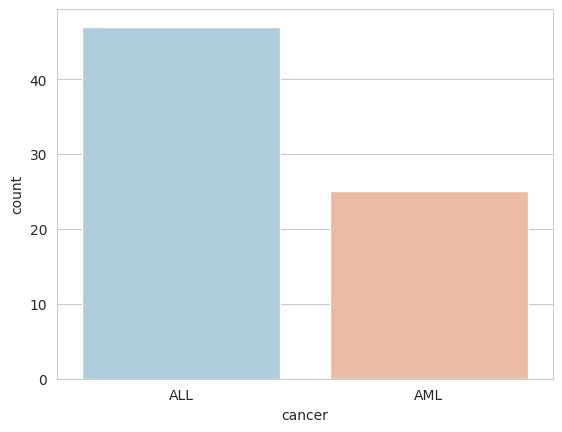

In [ ]:
sns.set_style('whitegrid')
sns.countplot(x = 'cancer', data= data1,palette = 'RdBu_r')

In [ ]:
# class values are in byte string format but we need them in integer format
# Converting them into string first
y = data1.cancer  # label
# len(y)
# y[0]
def cvt(str):
  return str.decode("utf-8")

for st in range(len(y)):
  y[st] = y[st]
# print(y)

<ipython-input-14-dcdbfd25af48>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y[st] = y[st]


In [ ]:
# Then convert them into integer
y.replace({"ALL": 0, "AML": 1}, inplace= True)

In [ ]:
y = y.astype(float)

In [ ]:
# grab our features
x = data1.drop(['cancer','patient','dataset'], axis=1)

In [ ]:
cols = (data1.columns).to_list()
len(cols)

5330

In [ ]:
# convert numpy array to dictionary
col_dict = dict(enumerate((x.columns.to_numpy()).flatten(), 0))
# col_dict

In [ ]:
len(col_dict)

5327

<a name='CorrelationMatrixPlot'></a>
## **Correlation Matrix Plot**

We have 24482 features and if we try to draw a correlation matrix of it, then it will take us forever and even by doing so we can't able to understand any info from that gaint matrix. So we gonna take a sample(100) of features out of 24482 and draw the matrix. We gonna do the same for rest of the plots.

<Axes: >

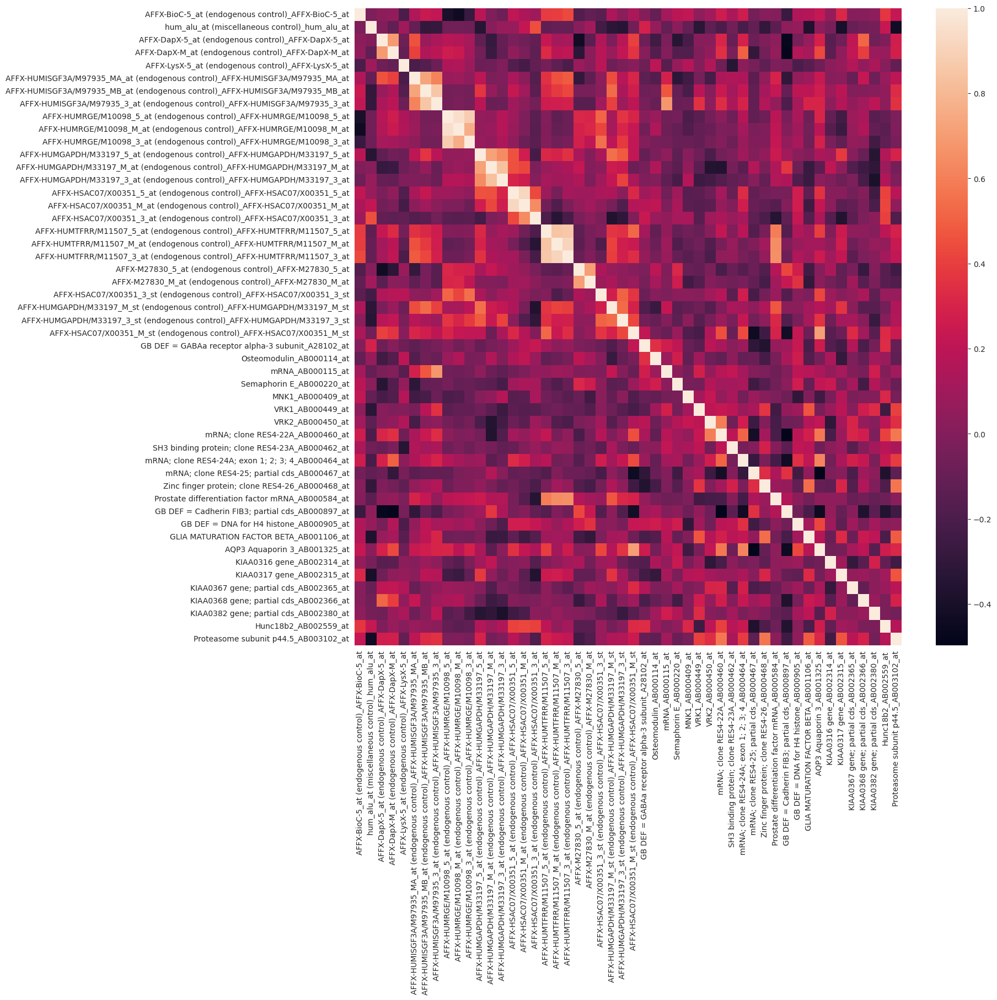

In [ ]:
data = data1[cols[:50]]
cor = data.corr()
plt.figure(figsize=(16,15))
sns.heatmap(cor)

<a name = 'Utils'></a>
# Utils

If you gonna perform K-fold cross-validation then train-test split is not needed.

In [ ]:
# here X is features and y is labels
# k is the num_ of splits usally k = 3, k =5, or k = 10
def kfold(k, model, X, y):

  # prepare the cross-validation procedure
  cv = KFold(n_splits=k, random_state=1, shuffle=True)  # 10-fold cross-validation
  # evaluate model
  scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
  # report performance
  acc = mean(scores)

  return acc, scores.min(), scores.max()

def k_evaluate(k,model,x , y):
  acc_list = {}
  for i in range(2, k+1):
    acc,_,_ = kfold(i, model, x, y)
    acc_list.update( {i : acc} )
    print(f"for fold: {i}, accuracy is: {acc_list.get(i)}")
  # get max
  m_key = max(acc_list, key = acc_list.get)
  print("Best fit"             )
  print(f"{m_key} gives accuracy of {acc_list.get(m_key)}")
  return acc_list.get(m_key) # acc


# error rate
def error_rate(xtrain, ytrain, x, opts):
    # parameters
    k     = opts['k']
    fold  = opts['fold']
    xt    = fold['xt']
    yt    = fold['yt']
    xv    = fold['xv']
    yv    = fold['yv']

    # Number of instances
    num_train = np.size(xt, 0)
    num_valid = np.size(xv, 0)
    # Define selected features
    xtrain  = xt[:, x == 1]
    ytrain  = yt.reshape(num_train)  # Solve bug
    xvalid  = xv[:, x == 1]
    yvalid  = yv.reshape(num_valid)  # Solve bug
    # Training
    mdl     = KNeighborsClassifier(n_neighbors = k)
    mdl.fit(xtrain, ytrain)
    # Prediction
    ypred   = mdl.predict(xvalid)
    acc     = np.sum(yvalid == ypred) / num_valid
    error   = 1 - acc

    return error


# Error rate & Feature size
def Fun(xtrain, ytrain, x, opts):
    # Parameters
    alpha    = 0.99
    beta     = 1 - alpha
    # Original feature size
    max_feat = len(x)
    # Number of selected features
    num_feat = np.sum(x == 1)
    # Solve if no feature selected
    if num_feat == 0:
        cost  = 1
    else:
        # Get error rate
        error = error_rate(xtrain, ytrain, x, opts)
        # Objective function
        cost  = alpha * error + beta * (num_feat / max_feat)

    return cost

In [ ]:
def evaluate_fn(Y_test,model_pred):
    # cm = confusion_matrix(Y_test.argmax(), model_pred.argmax())
    cm = confusion_matrix(Y_test.astype(int).tolist(), model_pred)

    True_Positives = cm[0][0]
    False_Positives = cm[0][1]

    True_Negetives = cm[1][1]
    False_Negetives = cm[1][0]

    # return True_Positives,False_Positives,False_Negetives,True_Negetives

    precision =  True_Positives / (True_Positives + False_Positives)
    recall = True_Positives / (True_Positives + False_Negetives)
    f1_score = 2*(precision * recall) / (precision + recall)

    return precision,recall,f1_score

# **Train test split**

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",x_test.shape)
print("y_test: ",y_test.shape)

x_train shape:  (57, 5327)
y_train shape:  (57,)
x_text:  (15, 5327)
y_test:  (15,)


**Scale the data**

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [ ]:
# x_train = pd.Series(x_train)

# Noramal Classification Methods

## Classification using SVM

In [ ]:
from sklearn.svm import SVC
model_SVC= SVC()
model_SVC.fit(x_train,y_train)

SVC()

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



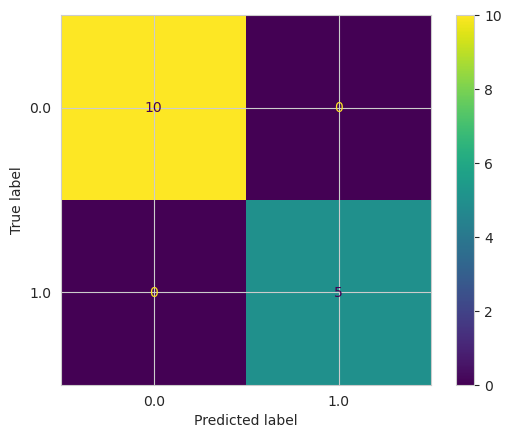

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

model_pred = model_SVC.predict(x_test)
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')
print(classification_report(y_test,model_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_SVC.classes_)
disp.plot()
print(classification_report(y_test,model_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


Using K-Fold

In [ ]:
acc = k_evaluate(10, model_SVC, x, y)

for fold: 2, accuracy is: 0.7361111111111112
for fold: 3, accuracy is: 0.8194444444444443
for fold: 4, accuracy is: 0.8333333333333334
for fold: 5, accuracy is: 0.8361904761904763
for fold: 6, accuracy is: 0.8611111111111112
for fold: 7, accuracy is: 0.8779220779220779
for fold: 8, accuracy is: 0.875
for fold: 9, accuracy is: 0.8888888888888888
for fold: 10, accuracy is: 0.8767857142857143
Best fit
9 gives accuracy of 0.8888888888888888


## With Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(x_train, y_train)

GaussianNB()

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



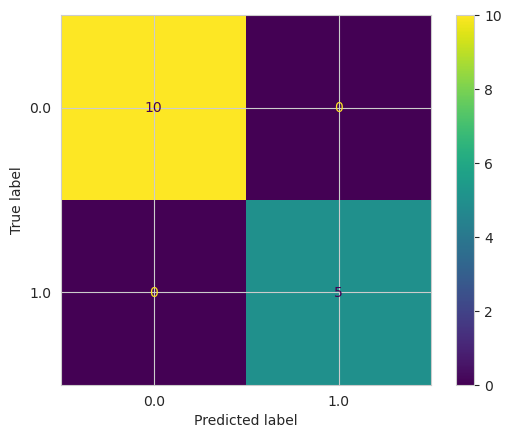

In [ ]:
y_pred = gnb.predict(x_test)
cm  = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
print(classification_report(y_test,y_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_test,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


Using K-Fold

In [ ]:
acc = k_evaluate(10, gnb, x, y)

for fold: 2, accuracy is: 0.9861111111111112
for fold: 3, accuracy is: 1.0
for fold: 4, accuracy is: 1.0
for fold: 5, accuracy is: 1.0
for fold: 6, accuracy is: 1.0
for fold: 7, accuracy is: 1.0
for fold: 8, accuracy is: 1.0
for fold: 9, accuracy is: 1.0
for fold: 10, accuracy is: 1.0
Best fit
3 gives accuracy of 1.0


## Decision Tree

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)
dt.fit(x_train,y_train)
dt_pred = dt.predict(x_test)

[[8 2]
 [0 5]]


              precision    recall  f1-score   support

         0.0       1.00      0.80      0.89        10
         1.0       0.71      1.00      0.83         5

    accuracy                           0.87        15
   macro avg       0.86      0.90      0.86        15
weighted avg       0.90      0.87      0.87        15



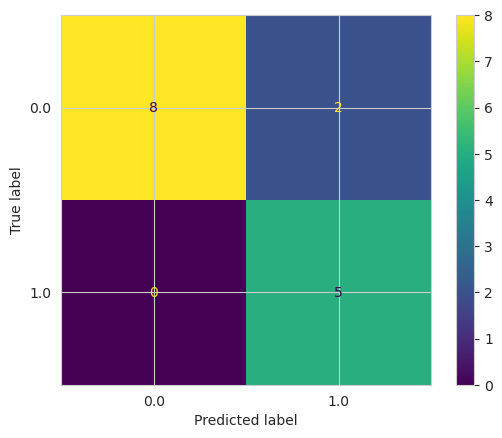

In [ ]:
cm = confusion_matrix(y_test,dt_pred)
print(cm)
print('\n')
print(classification_report(y_test,dt_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
acc = k_evaluate(10, dt, x, y)

precision :  0.8 
 recall : 1.0 
 f1_score : 0.888888888888889
for fold: 2, accuracy is: 0.8055555555555556
for fold: 3, accuracy is: 0.8194444444444445
for fold: 4, accuracy is: 0.8194444444444444
for fold: 5, accuracy is: 0.8752380952380954
for fold: 6, accuracy is: 0.8611111111111112
for fold: 7, accuracy is: 0.8623376623376624
for fold: 8, accuracy is: 0.8194444444444444
for fold: 9, accuracy is: 0.8472222222222222
for fold: 10, accuracy is: 0.8625
Best fit
5 gives accuracy of 0.8752380952380954


## LDA

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(x_test)
cm = confusion_matrix(y_test,lda_pred)

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



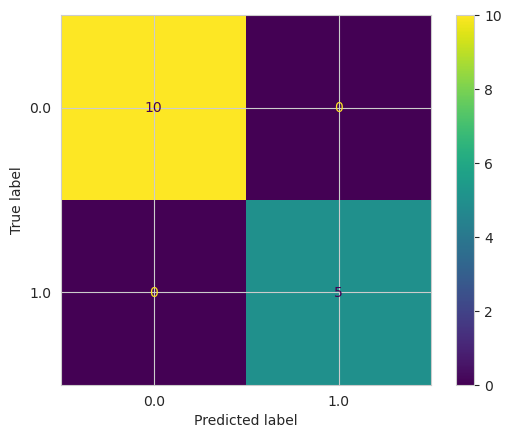

In [ ]:
print(cm)
print('\n')
print(classification_report(y_test,lda_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
acc = k_evaluate(10, lda, x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 0.875
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.875
for fold: 5, accuracy is: 0.8914285714285715
for fold: 6, accuracy is: 0.9166666666666666
for fold: 7, accuracy is: 0.9441558441558441
for fold: 8, accuracy is: 0.9305555555555556
for fold: 9, accuracy is: 0.9305555555555556
for fold: 10, accuracy is: 0.9321428571428572
Best fit
7 gives accuracy of 0.9441558441558441


## Random Forest

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        10
         1.0       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



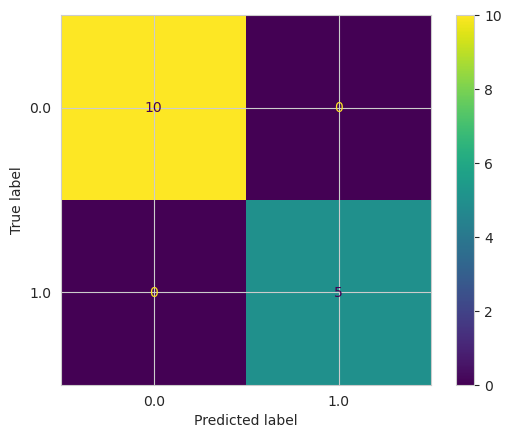

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(x_train, y_train)
y_pred = rf_classifier.predict(x_test)

cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
print(classification_report(y_test,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier, x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.9027777777777778
for fold: 3, accuracy is: 0.9722222222222223
for fold: 4, accuracy is: 0.9583333333333333
for fold: 5, accuracy is: 0.9733333333333334
for fold: 6, accuracy is: 0.986111111111111
for fold: 7, accuracy is: 0.9727272727272728
for fold: 8, accuracy is: 0.9722222222222222
for fold: 9, accuracy is: 0.9722222222222222
for fold: 10, accuracy is: 0.9732142857142858
Best fit
6 gives accuracy of 0.986111111111111


# Wrapper Methods

## Gray Wolf Optimization (GWO)

### Extracting Features

In [ ]:
from zoofs import GreyWolfOptimization

In [ ]:
# Set up objective function
from sklearn.metrics import log_loss
# make sure that objective fun shoud recieve 4 parameters
# Now fit your model to return objective vaule
def objective_function(model,X_train, y_train, X_valid, y_valid):
    model.fit(X_train,y_train)
    P=log_loss(y_valid,model.predict_proba(X_valid))
    return P


In [ ]:
# create object of algorithm
# population_size=? change this number if you want more features depending open your computation power
algo_object=GreyWolfOptimization(objective_function,n_iteration=20,
                                    population_size=100,minimize=True)

In [ ]:
x = data1.drop(['cancer','patient','dataset'], axis=1)

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.26, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",x_test.shape)
print("y_test: ",y_test.shape)

x_train shape:  (53, 5327)
y_train shape:  (53,)
x_text:  (19, 5327)
y_test:  (19,)


In [ ]:
# Import and initialize classifier
# import lightgbm as lgb
lgb_model = LinearDiscriminantAnalysis()

# Fit the classifier
features = algo_object.fit(lgb_model,x_train, y_train, x_train, y_train,verbose=True)

 [ 2023-09-06 21:47:56,648 ] Finished iteration #0 with objective value 0.28062480489076186. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:01,153 ] Finished iteration #1 with objective value 0.2851860594514488. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:05,642 ] Finished iteration #2 with objective value 0.28532065251810934. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:10,116 ] Finished iteration #3 with objective value 0.28495664298115025. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:14,581 ] Finished iteration #4 with objective value 0.28608898990616805. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:19,082 ] Finished iteration #5 with objective value 0.28140550353107724. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:23,760 ] Finished iteration #6 with objective value 0.286647515069181. Current best value is 0.28062480489076186 
 [ 2023-09-06 21:48:28,410 ] Finished iteration #7 

In [ ]:
len(features)

4348

### New Data Preparation

In [ ]:
# Fetching our new dataset with selected features
new_data = data1[features]
new_data.head()

,AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at,hum_alu_at (miscellaneous control)_hum_alu_at,AFFX-DapX-5_at (endogenous control)_AFFX-DapX-5_at,AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at,AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at,AFFX-HUMISGF3A/M97935_MA_at (endogenous control)_AFFX-HUMISGF3A/M97935_MA_at,AFFX-HUMISGF3A/M97935_MB_at (endogenous control)_AFFX-HUMISGF3A/M97935_MB_at,AFFX-HUMISGF3A/M97935_3_at (endogenous control)_AFFX-HUMISGF3A/M97935_3_at,AFFX-HUMRGE/M10098_5_at (endogenous control)_AFFX-HUMRGE/M10098_5_at,AFFX-HUMRGE/M10098_M_at (endogenous control)_AFFX-HUMRGE/M10098_M_at,...,INHA Inhibin; alpha_M13981_at,S100A9 S100 calcium-binding protein A9 (calgranulin B)_M21064_at,PLGL Plasminogen-like protein_M93143_at,Transcriptional activator hSNF2b_U29175_at,Transcription factor Stat5b (stat5b) mRNA_U48730_at,Breast epithelial antigen BA46 mRNA_U58516_at,TUBULIN ALPHA-4 CHAIN_X06956_at,PTGER3 Prostaglandin E receptor 3 (subtype EP3) {alternative products}_X83863_at,HMG2 High-mobility group (nonhistone chromosomal) protein 2_Z17240_at,RB1 Retinoblastoma 1 (including osteosarcoma)_L49218_f_at
0,88,15091,7,311,21,-13,215,797,14538,9738,...,61,273,384,1582,185,511,389,793,329,36
1,283,11038,37,134,-21,-219,116,433,615,115,...,-28,143,231,624,169,837,442,782,295,11
2,309,16692,183,378,67,104,476,1474,5669,3272,...,513,238,720,753,315,1199,168,1138,777,41
3,12,15763,45,268,43,-148,155,415,4850,2293,...,142,277,307,743,240,835,174,627,170,-50
4,168,18128,-28,118,-8,-55,122,483,1284,2731,...,71,134,178,626,156,649,504,250,314,14


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(new_data, y, test_size = 0.26, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
# Data scalling
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

x_train shape:  (53, 4348)
y_train shape:  (53,)


### Classification

#### SVC

In [ ]:
from sklearn.svm import SVC
model_SVC= SVC()
model_SVC.fit(x_train,y_train)
model_pred = model_SVC.predict(x_test)

from sklearn.metrics import classification_report, confusion_matrix
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')
print(classification_report(y_test,model_pred))

[[13  0]
 [ 0  6]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00         6

    accuracy                           1.00        19
   macro avg       1.00      1.00      1.00        19
weighted avg       1.00      1.00      1.00        19



for fold: 2, accuracy is: 0.75
for fold: 3, accuracy is: 0.8333333333333334
for fold: 4, accuracy is: 0.8333333333333334
for fold: 5, accuracy is: 0.8647619047619048
for fold: 6, accuracy is: 0.9166666666666666
for fold: 7, accuracy is: 0.9051948051948052
for fold: 8, accuracy is: 0.9166666666666666
for fold: 9, accuracy is: 0.9166666666666666
for fold: 10, accuracy is: 0.9053571428571429
Best fit
6 gives accuracy of 0.9166666666666666


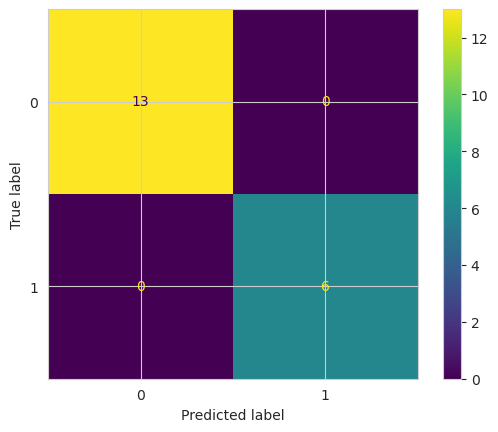

In [ ]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_SVC.classes_)
disp.plot()

# k fold cross validation
acc = k_evaluate(10, model_SVC, new_data, y)

#### Decision Tree

[[12  1]
 [ 2  4]]


              precision    recall  f1-score   support

           0       0.86      0.92      0.89        13
           1       0.80      0.67      0.73         6

    accuracy                           0.84        19
   macro avg       0.83      0.79      0.81        19
weighted avg       0.84      0.84      0.84        19



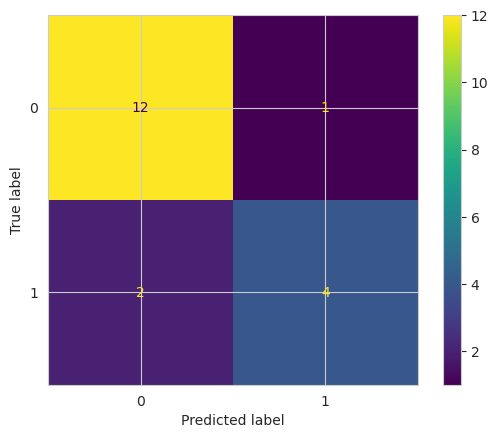

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)
dt.fit(x_train,y_train)
dt_pred = dt.predict(x_test)
cm = confusion_matrix(y_test,dt_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()
print('\n')
print(classification_report(y_test,dt_pred))


In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")

acc = k_evaluate(10, dt, new_data, y)  # here k 10

precision :  0.9230769230769231 
 recall : 0.8571428571428571 
 f1_score : 0.888888888888889


for fold: 2, accuracy is: 0.9166666666666666
for fold: 3, accuracy is: 0.8472222222222223
for fold: 4, accuracy is: 0.8888888888888888
for fold: 5, accuracy is: 0.8885714285714286
for fold: 6, accuracy is: 0.8472222222222222
for fold: 7, accuracy is: 0.8480519480519481
for fold: 8, accuracy is: 0.8333333333333333
for fold: 9, accuracy is: 0.7916666666666666
for fold: 10, accuracy is: 0.8357142857142856
Best fit
2 gives accuracy of 0.9166666666666666


#### LDA

[[13  0]
 [ 0  6]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00         6

    accuracy                           1.00        19
   macro avg       1.00      1.00      1.00        19
weighted avg       1.00      1.00      1.00        19



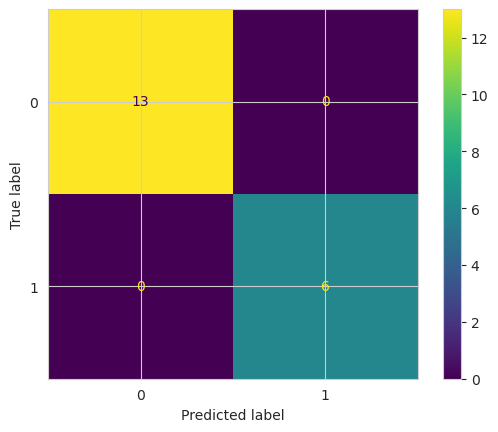

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(x_test)
cm  = confusion_matrix(y_test,lda_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()
print('\n')
print(classification_report(y_test,lda_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
acc = k_evaluate(10, lda, new_data, y)  # here k 10

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.875
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.875
for fold: 5, accuracy is: 0.8914285714285715
for fold: 6, accuracy is: 0.9305555555555555
for fold: 7, accuracy is: 0.9441558441558441
for fold: 8, accuracy is: 0.9444444444444444
for fold: 9, accuracy is: 0.9305555555555556
for fold: 10, accuracy is: 0.9321428571428572
Best fit
8 gives accuracy of 0.9444444444444444


#### Naive Bayes

[[12  1]
 [ 0  6]]


              precision    recall  f1-score   support

           0       1.00      0.92      0.96        13
           1       0.86      1.00      0.92         6

    accuracy                           0.95        19
   macro avg       0.93      0.96      0.94        19
weighted avg       0.95      0.95      0.95        19



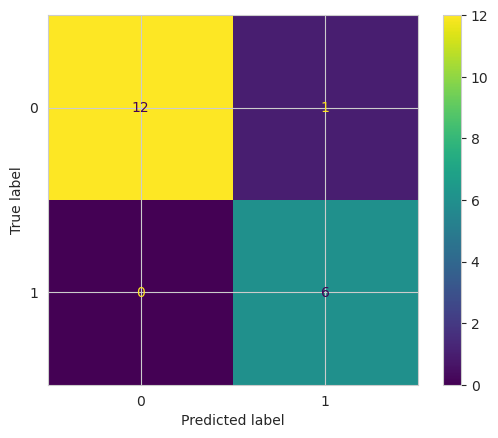

In [ ]:
gnb = GaussianNB()
gnb.fit(x_train, y_train)

y_pred = gnb.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_test,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, gnb, new_data, y)

precision :  0.9230769230769231 
 recall : 1.0 
 f1_score : 0.9600000000000001
for fold: 2, accuracy is: 0.9861111111111112
for fold: 3, accuracy is: 1.0
for fold: 4, accuracy is: 1.0
for fold: 5, accuracy is: 1.0
for fold: 6, accuracy is: 1.0
for fold: 7, accuracy is: 1.0
for fold: 8, accuracy is: 1.0
for fold: 9, accuracy is: 1.0
for fold: 10, accuracy is: 1.0
Best fit
3 gives accuracy of 1.0


#### Random Forest

[[13  0]
 [ 0  6]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00         6

    accuracy                           1.00        19
   macro avg       1.00      1.00      1.00        19
weighted avg       1.00      1.00      1.00        19



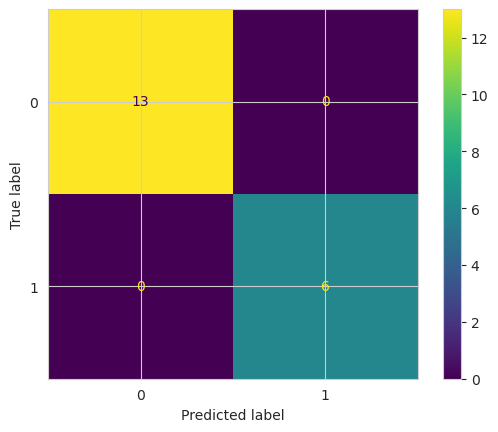

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(x_train, y_train)
y_pred = rf_classifier.predict(x_test)

cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
print(classification_report(y_test,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier, new_data, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.9166666666666667
for fold: 3, accuracy is: 0.9583333333333334
for fold: 4, accuracy is: 0.9583333333333333
for fold: 5, accuracy is: 0.9733333333333334
for fold: 6, accuracy is: 0.9722222222222222
for fold: 7, accuracy is: 0.987012987012987
for fold: 8, accuracy is: 0.9722222222222222
for fold: 9, accuracy is: 0.9861111111111112
for fold: 10, accuracy is: 0.9875
Best fit
10 gives accuracy of 0.9875


## Genetic Algorithm

### Implementation

In [ ]:
def init_position(lb, ub, N, dim):
    X = np.zeros([N, dim], dtype='float')
    for i in range(N):
        for d in range(dim):
            X[i,d] = lb[0,d] + (ub[0,d] - lb[0,d]) * rand()

    return X

def binary_conversion(X, thres, N, dim):
    Xbin = np.zeros([N, dim], dtype='int')
    for i in range(N):
        for d in range(dim):
            if X[i,d] > thres:
                Xbin[i,d] = 1
            else:
                Xbin[i,d] = 0

    return Xbin


def roulette_wheel(prob):
    num = len(prob)
    C   = np.cumsum(prob)
    P   = rand()
    for i in range(num):
        if C[i] > P:
            index = i;
            break

    return index


def genetic_search(xtrain, ytrain, opts):
    # Parameters
    ub       = 1
    lb       = 0
    thres    = 0.5
    CR       = 0.8     # crossover rate
    MR       = 0.01    # mutation rate

    N        = opts['N']
    max_iter = opts['T']
    if 'CR' in opts:
        CR   = opts['CR']
    if 'MR' in opts:
        MR   = opts['MR']

     # Dimension
    dim = np.size(xtrain, 1)
    if np.size(lb) == 1:
        ub = ub * np.ones([1, dim], dtype='float')
        lb = lb * np.ones([1, dim], dtype='float')

    # Initialize position
    X     = init_position(lb, ub, N, dim)

    # Binary conversion
    X     = binary_conversion(X, thres, N, dim)

    # Fitness at first iteration
    fit   = np.zeros([N, 1], dtype='float')
    Xgb   = np.zeros([1, dim], dtype='int')
    fitG  = float('inf')

    for i in range(N):
        fit[i,0] = Fun(xtrain, ytrain, X[i,:], opts)
        if fit[i,0] < fitG:
            Xgb[0,:] = X[i,:]
            fitG     = fit[i,0]

    # Pre
    curve = np.zeros([1, max_iter], dtype='float')
    t     = 0

    curve[0,t] = fitG.copy()
    print("Generation:", t + 1)
    print("Best (GA):", curve[0,t])
    t += 1

    while t < max_iter:
        # Probability
        inv_fit = 1 / (1 + fit)
        prob    = inv_fit / np.sum(inv_fit)

        # Number of crossovers
        Nc = 0
        for i in range(N):
            if rand() < CR:
              Nc += 1

        x1 = np.zeros([Nc, dim], dtype='int')
        x2 = np.zeros([Nc, dim], dtype='int')
        for i in range(Nc):
            # Parent selection
            k1      = roulette_wheel(prob)
            k2      = roulette_wheel(prob)
            P1      = X[k1,:].copy()
            P2      = X[k2,:].copy()
            # Random one dimension from 1 to dim
            index   = np.random.randint(low = 1, high = dim-1)
            # Crossover
            x1[i,:] = np.concatenate((P1[0:index] , P2[index:]))
            x2[i,:] = np.concatenate((P2[0:index] , P1[index:]))
            # Mutation
            for d in range(dim):
                if rand() < MR:
                    x1[i,d] = 1 - x1[i,d]

                if rand() < MR:
                    x2[i,d] = 1 - x2[i,d]


        # Merge two group into one
        Xnew = np.concatenate((x1 , x2), axis=0)

        # Fitness
        Fnew = np.zeros([2 * Nc, 1], dtype='float')
        for i in range(2 * Nc):
            Fnew[i,0] = Fun(xtrain, ytrain, Xnew[i,:], opts)
            if Fnew[i,0] < fitG:
                Xgb[0,:] = Xnew[i,:]
                fitG     = Fnew[i,0]

        # Store result
        curve[0,t] = fitG.copy()
        print("Generation:", t + 1)
        print("Best (GA):", curve[0,t])
        t += 1

        # Elitism
        XX  = np.concatenate((X , Xnew), axis=0)
        FF  = np.concatenate((fit , Fnew), axis=0)
        # Sort in ascending order
        ind = np.argsort(FF, axis=0)
        for i in range(N):
            X[i,:]   = XX[ind[i,0],:]
            fit[i,0] = FF[ind[i,0]].item()


    # Best feature subset
    Gbin       = Xgb[0,:]
    Gbin       = Gbin.reshape(dim)
    pos        = np.asarray(range(0, dim))
    sel_index  = pos[Gbin == 1]
    num_feat   = len(sel_index)
    # Create dictionary
    ga_data = {'sf': sel_index, 'c': curve, 'nf': num_feat}

    return ga_data

In [ ]:

X = data1.drop(['cancer','patient','dataset'], axis=1)
Y = y.values
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.27, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",x_test.shape)
print("y_test: ",y_test.shape)

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

x_train shape:  (52, 5327)
y_train shape:  (52,)
x_text:  (20, 5327)
y_test:  (20,)


In [ ]:
# parameter
k    = 5     # k-value in KNN
N    = 10    # number of chromosomes
T    = 100   # maximum number of generations
CR   = 0.8
MR   = 0.01

fold = {'xt':x_train, 'yt':y_train, 'xv':x_test, 'yv':y_test}

opts = {'k':k, 'fold':fold, 'N':N, 'T':T, 'CR':CR, 'MR':MR}

X = X.to_numpy()


In [ ]:
# perform feature selection
fmdl = genetic_search(X, Y, opts)
sf   = fmdl['sf']

Generation: 1
Best (GA): 0.05445400788436273
Generation: 2
Best (GA): 0.05439769100807213
Generation: 3
Best (GA): 0.054380795945184954
Generation: 4
Best (GA): 0.05436765534071715
Generation: 5
Best (GA): 0.05434512859020091
Generation: 6
Best (GA): 0.05432823352731373
Generation: 7
Best (GA): 0.0543188473812653
Generation: 8
Best (GA): 0.05429632063074906
Generation: 9
Best (GA): 0.05428881171391032
Generation: 10
Best (GA): 0.05428881171391032
Generation: 11
Best (GA): 0.05427003942181345
Generation: 12
Best (GA): 0.05427003942181345
Generation: 13
Best (GA): 0.05425689881734565
Generation: 14
Best (GA): 0.05425502158813596
Generation: 15
Best (GA): 0.05424000375445847
Generation: 16
Best (GA): 0.05424000375445847
Generation: 17
Best (GA): 0.0542212314623616
Generation: 18
Best (GA): 0.05421747700394223
Generation: 19
Best (GA): 0.0542080908578938
Generation: 20
Best (GA): 0.05419682748263568
Generation: 21
Best (GA): 0.05418931856579693
Generation: 22
Best (GA): 0.05418931856579693

### Data Creation

In [ ]:
# model with selected features
num_train = np.size(x_train, 0)
num_valid = np.size(x_test, 0)
x_train   = x_train[:, sf]
y_train   = y_train.reshape(num_train)
x_valid   = x_test[:, sf]
y_valid   = y_test.reshape(num_valid)

In [ ]:
f = fmdl['sf']   ## its 11
# featching features
features = []
for key, val in col_dict.items():
  if key in f:
    features.append(col_dict.get(key))
print(len(features))

2211


In [ ]:
new_x = x[features]
new_x.head()

,AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at,AFFX-DapX-5_at (endogenous control)_AFFX-DapX-5_at,AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at,AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at,AFFX-HUMRGE/M10098_5_at (endogenous control)_AFFX-HUMRGE/M10098_5_at,AFFX-HUMRGE/M10098_3_at (endogenous control)_AFFX-HUMRGE/M10098_3_at,AFFX-HUMGAPDH/M33197_M_at (endogenous control)_AFFX-HUMGAPDH/M33197_M_at,AFFX-HUMGAPDH/M33197_3_at (endogenous control)_AFFX-HUMGAPDH/M33197_3_at,AFFX-HSAC07/X00351_M_at (endogenous control)_AFFX-HSAC07/X00351_M_at,AFFX-M27830_5_at (endogenous control)_AFFX-M27830_5_at,...,WUGSC:GS345D13.2 gene (G-protein gamma-1 subunit) extracted from Human BAC clone GS345D13 from 7q31-q32_AC002076_cds2_at,TYROSINE-PROTEIN KINASE ITK/TSK_L10717_at,INHA Inhibin; alpha_M13981_at,PLGL Plasminogen-like protein_M93143_at,Transcriptional activator hSNF2b_U29175_at,Transcription factor Stat5b (stat5b) mRNA_U48730_at,TUBULIN ALPHA-4 CHAIN_X06956_at,PTGER3 Prostaglandin E receptor 3 (subtype EP3) {alternative products}_X83863_at,RB1 Retinoblastoma 1 (including osteosarcoma)_L49218_f_at,GB DEF = mRNA (clone 1A7)_Z78285_f_at
0,88,7,311,21,14538,8529,11126,17782,18727,6750,...,-68,108,61,384,1582,185,389,793,36,-37
1,283,37,134,-21,615,1518,13568,18112,20668,2215,...,14,303,-28,231,624,169,442,782,11,-14
2,309,183,378,67,5669,3668,16756,23006,24672,3325,...,-58,143,513,720,753,315,168,1138,41,-41
3,12,45,268,43,4850,2569,11439,17633,18773,3058,...,-35,22,142,307,743,240,174,627,-50,-91
4,168,-28,118,-8,1284,316,15030,17384,19091,1130,...,18,44,71,178,626,156,504,250,14,-25


<a name='cga'></a>
### Correlation Matrix with feature selected by GA

<Axes: >

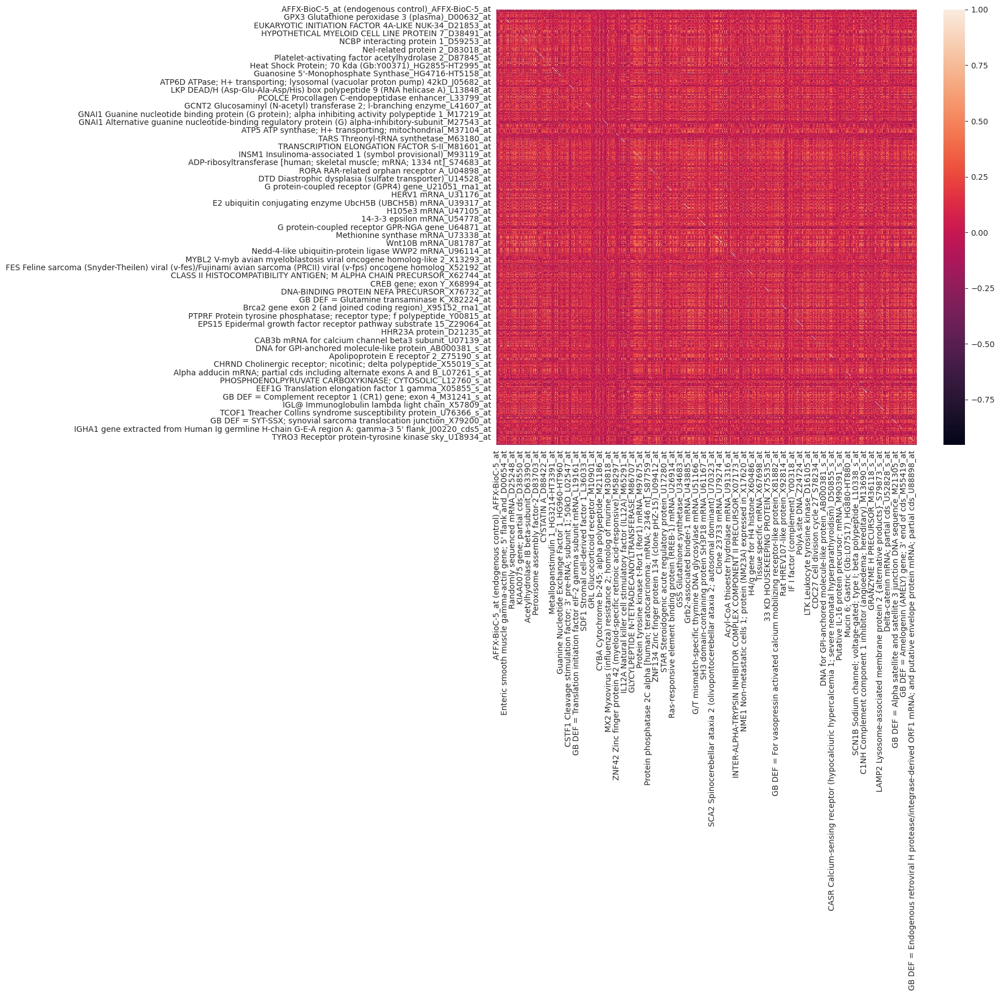

In [ ]:
cor = data1[features].corr()
plt.figure(figsize=(12,10))
sns.heatmap(cor)

### Classification

#### Using SVM

[[13  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        13
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        13
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



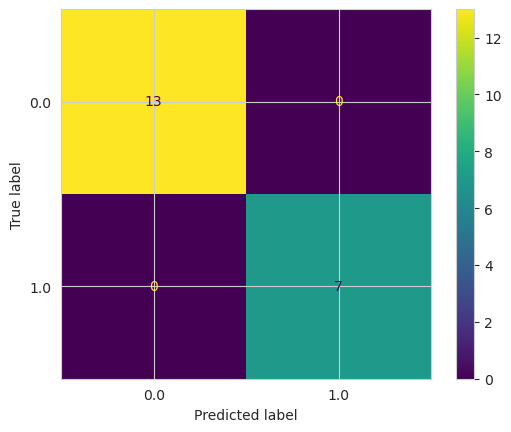

In [ ]:
model = SVC()
model.fit(x_train, y_train)
model_pred = model.predict(x_valid)
cm = confusion_matrix(y_valid,model_pred)
print(cm)
print('\n')
print(classification_report(y_test,model_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
disp.plot()
print(classification_report(y_valid,model_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

acc = k_evaluate(10, model, new_x, y)  # here k 10

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 0.6944444444444444
for fold: 3, accuracy is: 0.7916666666666666
for fold: 4, accuracy is: 0.763888888888889
for fold: 5, accuracy is: 0.7952380952380952
for fold: 6, accuracy is: 0.8194444444444445
for fold: 7, accuracy is: 0.8506493506493505
for fold: 8, accuracy is: 0.8194444444444444
for fold: 9, accuracy is: 0.8472222222222222
for fold: 10, accuracy is: 0.8785714285714287
Best fit
10 gives accuracy of 0.8785714285714287


#### Using Decision Tree

precision :  0.7692307692307693 
 recall : 1.0 
 f1_score : 0.8695652173913044
[[10  3]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      0.77      0.87        13
         1.0       0.70      1.00      0.82         7

    accuracy                           0.85        20
   macro avg       0.85      0.88      0.85        20
weighted avg       0.89      0.85      0.85        20

              precision    recall  f1-score   support

         0.0       1.00      0.77      0.87        13
         1.0       0.70      1.00      0.82         7

    accuracy                           0.85        20
   macro avg       0.85      0.88      0.85        20
weighted avg       0.89      0.85      0.85        20

precision :  0.7692307692307693 
 recall : 1.0 
 f1_score : 0.8695652173913044




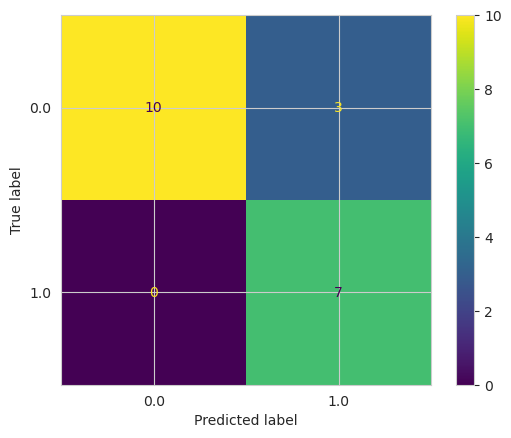

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)
dt.fit(x_train,y_train)
dt_pred = dt.predict(x_valid)

cm = confusion_matrix(y_valid,dt_pred)
print(cm)
print('\n')
print(classification_report(y_valid,dt_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()
print(classification_report(y_valid, dt_pred))

# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print('\n')

In [ ]:
acc = k_evaluate(10, dt, new_x, y)  # here k 10

for fold: 2, accuracy is: 0.7916666666666667
for fold: 3, accuracy is: 0.888888888888889
for fold: 4, accuracy is: 0.9027777777777778
for fold: 5, accuracy is: 0.9161904761904761
for fold: 6, accuracy is: 0.9027777777777778
for fold: 7, accuracy is: 0.9025974025974026
for fold: 8, accuracy is: 0.9027777777777777
for fold: 9, accuracy is: 0.8888888888888888
for fold: 10, accuracy is: 0.8875
Best fit
5 gives accuracy of 0.9161904761904761


#### Naive Bayes

[[12  1]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96        13
         1.0       0.88      1.00      0.93         7

    accuracy                           0.95        20
   macro avg       0.94      0.96      0.95        20
weighted avg       0.96      0.95      0.95        20



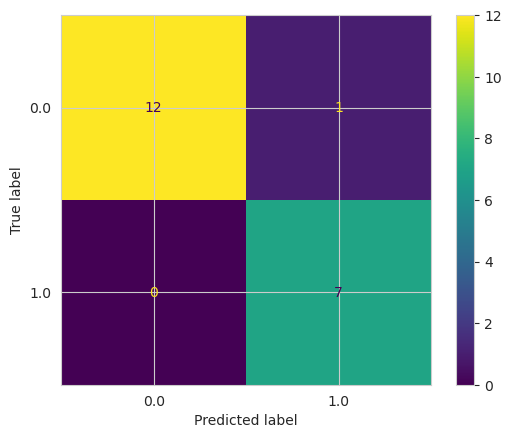

In [ ]:
gnb = GaussianNB()
gnb.fit(x_train, y_train)

y_pred = gnb.predict(x_valid)
cm = confusion_matrix(y_valid,y_pred)
print(cm)
print('\n')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_valid,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, gnb, new_x, y)

precision :  0.9230769230769231 
 recall : 1.0 
 f1_score : 0.9600000000000001
for fold: 2, accuracy is: 0.9444444444444444
for fold: 3, accuracy is: 0.9722222222222223
for fold: 4, accuracy is: 0.9583333333333333
for fold: 5, accuracy is: 0.9723809523809525
for fold: 6, accuracy is: 0.9722222222222222
for fold: 7, accuracy is: 0.9727272727272727
for fold: 8, accuracy is: 0.9722222222222222
for fold: 9, accuracy is: 0.9722222222222222
for fold: 10, accuracy is: 0.9732142857142858
Best fit
10 gives accuracy of 0.9732142857142858


#### Using LDA

[[12  1]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96        13
         1.0       0.88      1.00      0.93         7

    accuracy                           0.95        20
   macro avg       0.94      0.96      0.95        20
weighted avg       0.96      0.95      0.95        20

              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96        13
         1.0       0.88      1.00      0.93         7

    accuracy                           0.95        20
   macro avg       0.94      0.96      0.95        20
weighted avg       0.96      0.95      0.95        20

precision :  0.9230769230769231 
 recall : 1.0 
 f1_score : 0.9600000000000001




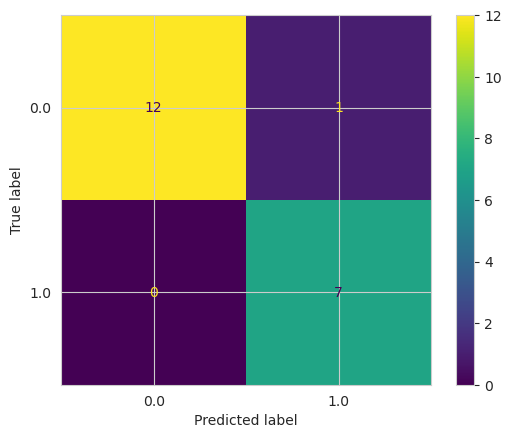

In [ ]:

lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(x_valid)
cm = confusion_matrix(y_valid,lda_pred)
print(cm)
print('\n')
print(classification_report(y_valid,lda_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()
print(classification_report(y_valid,lda_pred))

# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print('\n')

In [ ]:
# K-FOLD Cross Validation
acc = k_evaluate(10, lda, new_x, y)  # here k 10

for fold: 2, accuracy is: 0.8333333333333334
for fold: 3, accuracy is: 0.9305555555555557
for fold: 4, accuracy is: 0.875
for fold: 5, accuracy is: 0.9047619047619048
for fold: 6, accuracy is: 0.9305555555555555
for fold: 7, accuracy is: 0.9038961038961039
for fold: 8, accuracy is: 0.9166666666666666
for fold: 9, accuracy is: 0.9027777777777778
for fold: 10, accuracy is: 0.9196428571428571
Best fit
3 gives accuracy of 0.9305555555555557


#### Random Forest

[[13  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        13
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



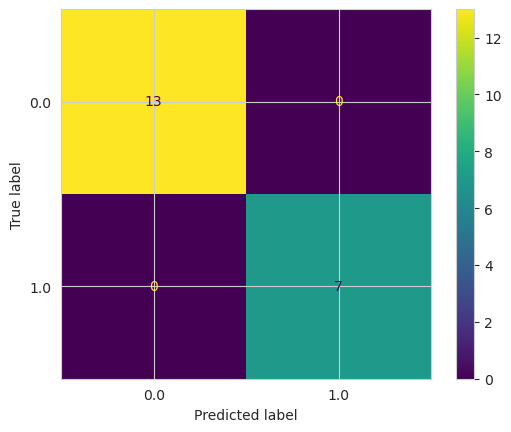

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(x_train, y_train)
y_pred = rf_classifier.predict(x_valid)

cm = confusion_matrix(y_valid,y_pred)
print(cm)
print('\n')
print(classification_report(y_valid,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier, new_x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.9305555555555556
for fold: 3, accuracy is: 0.9722222222222223
for fold: 4, accuracy is: 0.9722222222222222
for fold: 5, accuracy is: 0.9733333333333334
for fold: 6, accuracy is: 0.9722222222222222
for fold: 7, accuracy is: 0.9597402597402598
for fold: 8, accuracy is: 0.9722222222222222
for fold: 9, accuracy is: 0.9861111111111112
for fold: 10, accuracy is: 0.9732142857142858
Best fit
9 gives accuracy of 0.9861111111111112


## Using PSO (Particle Swarm Optimization)

### Implementation

In [ ]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.svm import SVC
from sklearn.datasets import load_breast_cancer
from niapy.problems import Problem
from niapy.task import Task
from niapy.algorithms.basic import ParticleSwarmOptimization

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
class SVMFeatureSelection(Problem):
    def __init__(self, X_train, y_train, alpha=0.99):
        super().__init__(dimension=X_train.shape[1], lower=0, upper=1)
        self.X_train = X_train
        self.y_train = y_train
        self.alpha = alpha

    def _evaluate(self, x):
        selected = x > 0.5
        num_selected = selected.sum()
        if num_selected == 0:
            return 1.0
        accuracy = cross_val_score(SVC(), self.X_train[:, selected], self.y_train, cv=2, n_jobs=-1).mean()
        score = 1 - accuracy
        num_features = self.X_train.shape[1]
        return self.alpha * score + (1 - self.alpha) * (num_selected / num_features)

In [ ]:
# grab our features
x = data1.drop(['cancer','patient','dataset'], axis=1)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 101)
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

print("x_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
feature_names = x.columns
feature_names

x_train shape:  (57, 5327)
y_train shape:  (57,)


Index(['AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at',
       'hum_alu_at (miscellaneous control)_hum_alu_at',
       'AFFX-DapX-5_at (endogenous control)_AFFX-DapX-5_at',
       'AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at',
       'AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at',
       'AFFX-HUMISGF3A/M97935_MA_at (endogenous control)_AFFX-HUMISGF3A/M97935_MA_at',
       'AFFX-HUMISGF3A/M97935_MB_at (endogenous control)_AFFX-HUMISGF3A/M97935_MB_at',
       'AFFX-HUMISGF3A/M97935_3_at (endogenous control)_AFFX-HUMISGF3A/M97935_3_at',
       'AFFX-HUMRGE/M10098_5_at (endogenous control)_AFFX-HUMRGE/M10098_5_at',
       'AFFX-HUMRGE/M10098_M_at (endogenous control)_AFFX-HUMRGE/M10098_M_at',
       ...
       'PLGL Plasminogen-like protein_M93143_at',
       'Transcriptional activator hSNF2b_U29175_at',
       'Transcription factor Stat5b (stat5b) mRNA_U48730_at',
       'Breast epithelial antigen BA46 mRNA_U58516_at',
       'TUBULIN ALPHA-4 CHAIN_X06956_at',
       'P

In [ ]:
problem = SVMFeatureSelection(X_train, y_train)
task = Task(problem, max_iters=100)
algorithm = ParticleSwarmOptimization(population_size=100, seed=1234)
best_features, best_fitness = algorithm.run(task)

In [ ]:
selected_features = best_features > 0.5
print('Number of selected features:', selected_features.sum())
features = feature_names[selected_features].tolist()

Number of selected features: 2503
Selected features: AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at, AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at, AFFX-HUMISGF3A/M97935_MB_at (endogenous control)_AFFX-HUMISGF3A/M97935_MB_at, AFFX-HUMGAPDH/M33197_5_at (endogenous control)_AFFX-HUMGAPDH/M33197_5_at, AFFX-HUMGAPDH/M33197_M_at (endogenous control)_AFFX-HUMGAPDH/M33197_M_at, AFFX-HUMGAPDH/M33197_3_at (endogenous control)_AFFX-HUMGAPDH/M33197_3_at, AFFX-HSAC07/X00351_3_at (endogenous control)_AFFX-HSAC07/X00351_3_at, AFFX-HUMTFRR/M11507_3_at (endogenous control)_AFFX-HUMTFRR/M11507_3_at, AFFX-M27830_5_at (endogenous control)_AFFX-M27830_5_at, AFFX-HUMGAPDH/M33197_M_st (endogenous control)_AFFX-HUMGAPDH/M33197_M_st, AFFX-HSAC07/X00351_M_st (endogenous control)_AFFX-HSAC07/X00351_M_st, mRNA_AB000115_at, Semaphorin E_AB000220_at, VRK2_AB000450_at, mRNA; clone RES4-24A; exon 1; 2; 3; 4_AB000464_at, Zinc finger protein; clone RES4-26_AB000468_at, Prostate differentiation factor mRNA_AB0

In [ ]:
new_x = x[feature_names[selected_features]]
new_x.head()

,AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at,AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at,AFFX-HUMISGF3A/M97935_MB_at (endogenous control)_AFFX-HUMISGF3A/M97935_MB_at,AFFX-HUMGAPDH/M33197_5_at (endogenous control)_AFFX-HUMGAPDH/M33197_5_at,AFFX-HUMGAPDH/M33197_M_at (endogenous control)_AFFX-HUMGAPDH/M33197_M_at,AFFX-HUMGAPDH/M33197_3_at (endogenous control)_AFFX-HUMGAPDH/M33197_3_at,AFFX-HSAC07/X00351_3_at (endogenous control)_AFFX-HSAC07/X00351_3_at,AFFX-HUMTFRR/M11507_3_at (endogenous control)_AFFX-HUMTFRR/M11507_3_at,AFFX-M27830_5_at (endogenous control)_AFFX-M27830_5_at,AFFX-HUMGAPDH/M33197_M_st (endogenous control)_AFFX-HUMGAPDH/M33197_M_st,...,HLA-A MHC class I protein HLA-A (HLA-A28;-B40; -Cw3)_M94880_f_at,HLA CLASS II HISTOCOMPATIBILITY ANTIGEN; DQ(W1.1) BETA CHAIN PRECURSOR_X03068_f_at,GB DEF = Endogenous retrovirus clone P1.8 polymerase mRNA; partial cds_U87593_f_at,Integrase gene extracted from Human endogenous retrovirus H clone g10.34 integrase and putative envelope protein genes; partial cds_U88902_cds1_f_at,WUGSC:GS345D13.2 gene (G-protein gamma-1 subunit) extracted from Human BAC clone GS345D13 from 7q31-q32_AC002076_cds2_at,PLGL Plasminogen-like protein_M93143_at,Transcriptional activator hSNF2b_U29175_at,Breast epithelial antigen BA46 mRNA_U58516_at,TUBULIN ALPHA-4 CHAIN_X06956_at,GB DEF = Glycophorin Sta (type A) exons 3 and 4; partial_M71243_f_at
0,311,21,215,15076,11126,17782,15774,298,6750,132,...,10882,2762,-67,346,-68,384,1582,511,389,191
1,134,-21,116,19448,13568,18112,16959,285,2215,301,...,11789,1567,-88,290,14,231,624,837,442,76
2,378,67,476,27410,16756,23006,18285,187,3325,524,...,5023,1090,9,220,-58,720,753,1199,168,228
3,268,43,155,14920,11439,17633,14245,260,3058,-76,...,9567,1708,45,430,-35,307,743,835,174,126
4,118,-8,122,14653,15030,17384,18323,287,1130,89,...,8512,1503,29,159,18,178,626,649,504,56


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_x, y, test_size = 0.27, random_state = 101)
print("x_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",X_test.shape)
print("y_test: ",y_test.shape)

x_train shape:  (52, 2503)
y_train shape:  (52,)
x_text:  (20, 2503)
y_test:  (20,)


<a name='cpso'></a>
#### Correlation Matrix after PSO

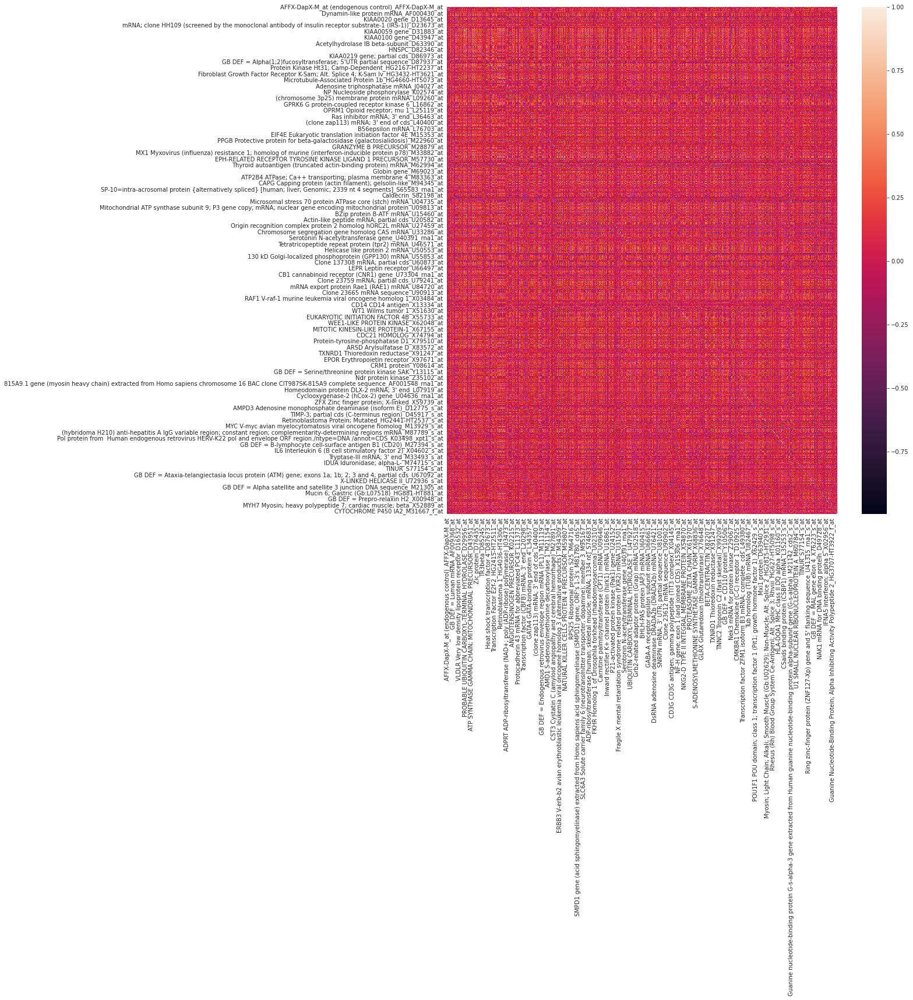

In [ ]:
new_x = data1[feature_names[selected_features]]
cor = new_x.corr()
plt.figure(figsize=(15,16))
sns.heatmap(cor)

### Classification

#### Using SVM

Model accuracy: 0.95
[[13  0]
 [ 1  6]]


              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96        13
         1.0       1.00      0.86      0.92         7

    accuracy                           0.95        20
   macro avg       0.96      0.93      0.94        20
weighted avg       0.95      0.95      0.95        20



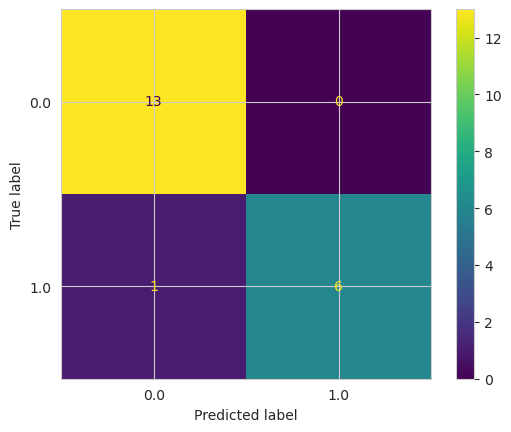

In [ ]:
model = SVC()
# X_train = sc.fit_transform(X_train[:, selected_features])
# X_test = sc.transform(X_test[:, selected_features])
model.fit(X_train, y_train)
print('Model accuracy:', model.score(X_test, y_test))

# plot confusion matrix
model_pred = model.predict(X_test)
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')
print(classification_report(y_test,model_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
disp.plot()

In [ ]:
# Calculate all
model_pred = model.predict(X_test)
precision,recall,f1_score = evaluate_fn(y_test, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
#K-fold
acc = k_evaluate(10,model, new_x, y)  # here k 10

precision :  1.0 
 recall : 0.9285714285714286 
 f1_score : 0.962962962962963


for fold: 2, accuracy is: 0.875
for fold: 3, accuracy is: 0.9305555555555557
for fold: 4, accuracy is: 0.9027777777777779
for fold: 5, accuracy is: 0.9314285714285713
for fold: 6, accuracy is: 0.9444444444444445
for fold: 7, accuracy is: 0.9454545454545455
for fold: 8, accuracy is: 0.9444444444444444
for fold: 9, accuracy is: 0.9444444444444444
for fold: 10, accuracy is: 0.9464285714285715
Best fit
10 gives accuracy of 0.9464285714285715


#### Using Decision Tree

Subset accuracy: 0.85
[[12  1]
 [ 2  5]]


              precision    recall  f1-score   support

         0.0       0.86      0.92      0.89        13
         1.0       0.83      0.71      0.77         7

    accuracy                           0.85        20
   macro avg       0.85      0.82      0.83        20
weighted avg       0.85      0.85      0.85        20



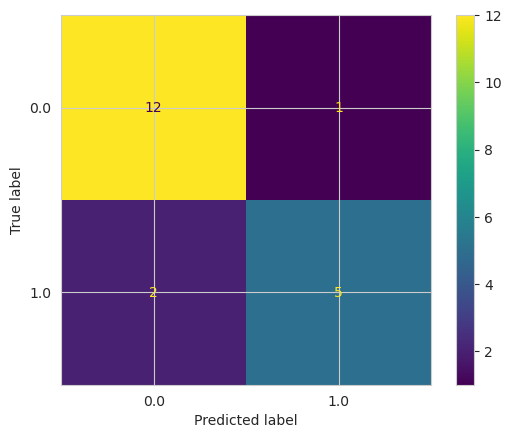

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)

# X_train = sc.fit_transform(X_train[:, selected_features])
# X_test = sc.transform(X_test[:, selected_features])
dt.fit(X_train, y_train)
print('Subset accuracy:', dt.score(X_test, y_test))

# plot confusion matrix
model_pred = dt.predict(X_test)
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')
print(classification_report(y_test,model_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()

In [ ]:
# Calculate all
model_pred = dt.predict(X_test)
precision,recall,f1_score = evaluate_fn(y_test, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")

#k-fold
acc = k_evaluate(10,dt, new_x, y)  # here k 10

precision :  0.9230769230769231 
 recall : 0.8571428571428571 
 f1_score : 0.888888888888889


for fold: 2, accuracy is: 0.9166666666666666
for fold: 3, accuracy is: 0.9305555555555555
for fold: 4, accuracy is: 0.8750000000000001
for fold: 5, accuracy is: 0.8742857142857143
for fold: 6, accuracy is: 0.8472222222222222
for fold: 7, accuracy is: 0.861038961038961
for fold: 8, accuracy is: 0.8472222222222221
for fold: 9, accuracy is: 0.8472222222222222
for fold: 10, accuracy is: 0.8321428571428571
Best fit
3 gives accuracy of 0.9305555555555555


#### Using Naive Bayes

[[12  1]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96        13
         1.0       0.88      1.00      0.93         7

    accuracy                           0.95        20
   macro avg       0.94      0.96      0.95        20
weighted avg       0.96      0.95      0.95        20



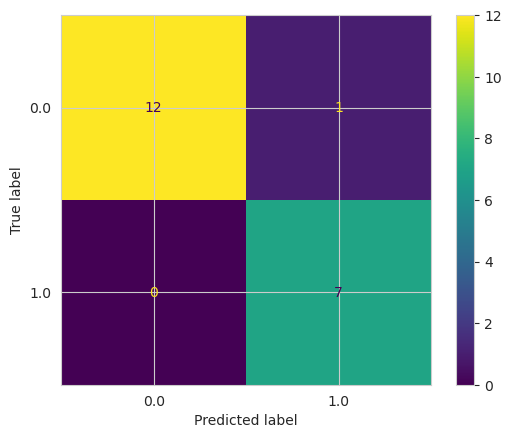

In [ ]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)

y_pred = gnb.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_test,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, gnb, new_x, y)

precision :  0.9230769230769231 
 recall : 1.0 
 f1_score : 0.9600000000000001
for fold: 2, accuracy is: 0.9861111111111112
for fold: 3, accuracy is: 0.9861111111111112
for fold: 4, accuracy is: 1.0
for fold: 5, accuracy is: 0.9714285714285715
for fold: 6, accuracy is: 0.9722222222222222
for fold: 7, accuracy is: 0.9857142857142858
for fold: 8, accuracy is: 0.9861111111111112
for fold: 9, accuracy is: 0.9861111111111112
for fold: 10, accuracy is: 0.9857142857142858
Best fit
4 gives accuracy of 1.0


#### Using LDA

Subset accuracy: 1.0
[[13  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        13
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20



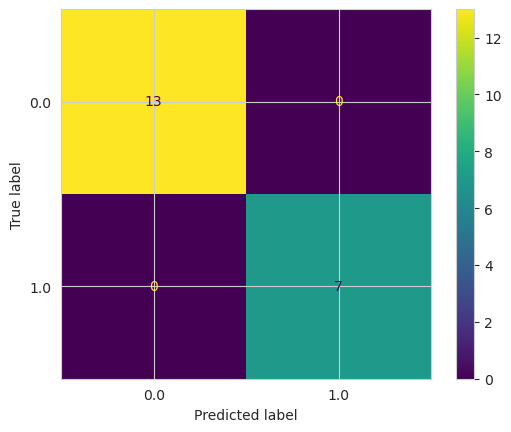

In [ ]:
lda = LinearDiscriminantAnalysis()

lda.fit(X_train, y_train)
print('Subset accuracy:', lda.score(X_test, y_test))

# plot confusion matrix
model_pred = lda.predict(X_test)
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')
print(classification_report(y_test,model_pred))

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()

In [ ]:
# Calculate all
model_pred = lda.predict(X_test)
precision,recall,f1_score = evaluate_fn(y_test, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")

#k-fold
acc = k_evaluate(10, lda, new_x, y)  # here k 10

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.8888888888888888
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.9027777777777778
for fold: 5, accuracy is: 0.9180952380952382
for fold: 6, accuracy is: 0.9166666666666666
for fold: 7, accuracy is: 0.9441558441558442
for fold: 8, accuracy is: 0.9583333333333333
for fold: 9, accuracy is: 0.9444444444444444
for fold: 10, accuracy is: 0.9321428571428572
Best fit
8 gives accuracy of 0.9583333333333333


#### Random Forest

[[13  0]
 [ 1  6]]


              precision    recall  f1-score   support

         0.0       0.93      1.00      0.96        13
         1.0       1.00      0.86      0.92         7

    accuracy                           0.95        20
   macro avg       0.96      0.93      0.94        20
weighted avg       0.95      0.95      0.95        20



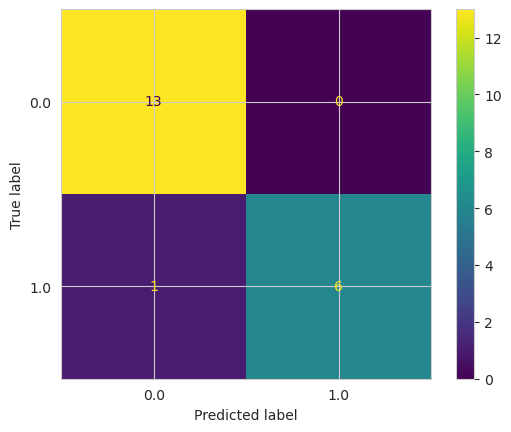

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
print(classification_report(y_test,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier, new_x, y)

precision :  1.0 
 recall : 0.9285714285714286 
 f1_score : 0.962962962962963


for fold: 2, accuracy is: 0.9166666666666667
for fold: 3, accuracy is: 0.9583333333333334
for fold: 4, accuracy is: 0.9722222222222222
for fold: 5, accuracy is: 0.959047619047619
for fold: 6, accuracy is: 0.9722222222222222
for fold: 7, accuracy is: 0.974025974025974
for fold: 8, accuracy is: 0.9722222222222222
for fold: 9, accuracy is: 0.9583333333333334
for fold: 10, accuracy is: 0.9875
Best fit
10 gives accuracy of 0.9875


#### With JAYA Algorithm

In [ ]:
# Path to directory provided.
%cd "/content/drive/MyDrive/Adv Machine Learning/Wrapper_Feature_Selection_Methods"

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from FS.ja import jfs   # change this to switch algorithm

In [ ]:

# grab our features
y = data1['cancer']
y = y.values
x = data1.drop(['cancer','patient','dataset'], axis=1)
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",x_test.shape)
print("y_test: ",y_test.shape)

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

x_train shape:  (57, 5327)
y_train shape:  (57,)
x_text:  (15, 5327)
y_test:  (15,)


In [ ]:
# parameter
k    = 5     # k-value in KNN
N    = 10    # number of chromosomes
T    = 100   # maximum number of generations
CR   = 0.8
MR   = 0.01
fold = {'xt':x_train, 'yt':y_train, 'xv':x_test, 'yv':y_test}
x = x.to_numpy()
opts = {'k':k, 'fold':fold, 'N':N, 'T':T, 'CR':CR, 'MR':MR}


In [ ]:
print(type(x))
print(type(y))
# make sure the type should be 'numpy.ndarray' for both.

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [ ]:
# perform feature selection
fmdl = jfs(x, y, opts)
sf   = fmdl['sf']

In [ ]:
# model with selected features
num_train = np.size(x_train, 0)
num_valid = np.size(x_test, 0)
x_train   = x_train[:, sf]
y_train   = y_train.reshape(num_train)  # Solve bug
x_valid   = x_test[:, sf]
y_valid   = y_test.reshape(num_valid)  # Solve bug

In [ ]:
f = fmdl['sf']
len(f)

2430

<a name='cjaya'></a>
##### Correlation Matrix after JAYA feature selection

number of feature selected:  2430


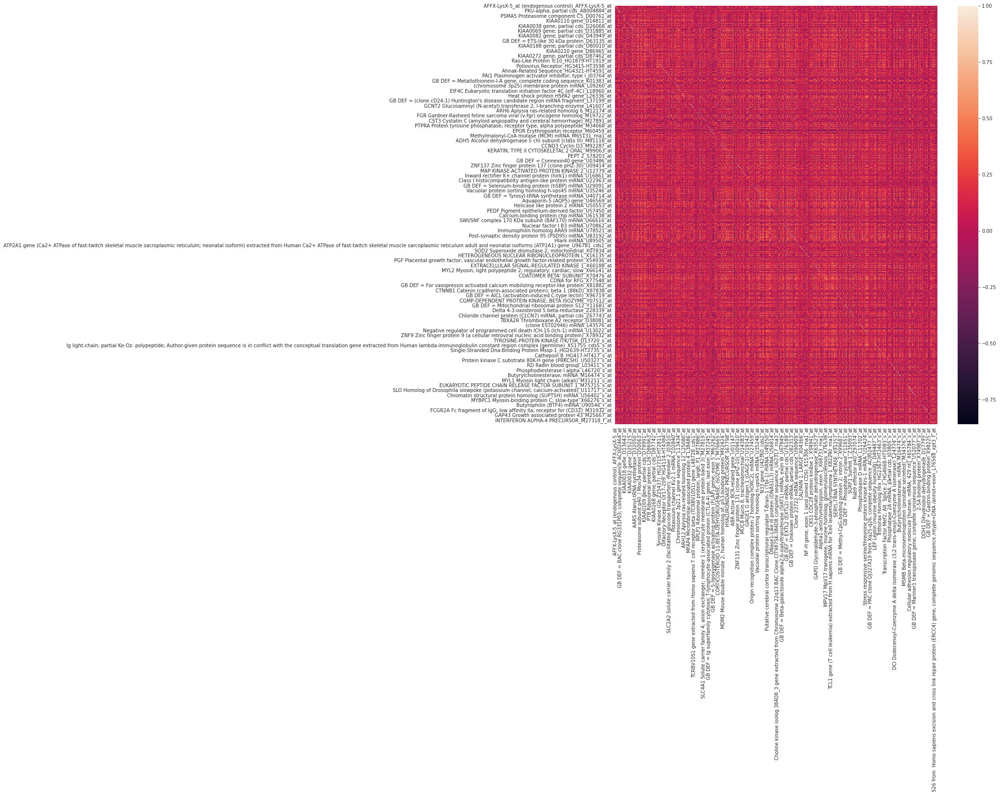

In [ ]:

# featching features
features = []
for key, val in col_dict.items():
  if key in f:
    features.append(col_dict.get(key))

print("number of feature selected: ", len(features))
cor = data1[features].corr()
plt.figure(figsize=(15,16))
sns.heatmap(cor)

In [ ]:
# creating our new train set for KFold
new_data = data1[features]

##### SVM

In [ ]:
# Model
model = SVC()
model.fit(x_train,y_train)
model_pred = model.predict(x_valid)

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


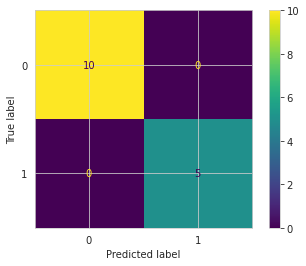

In [ ]:
print(confusion_matrix(y_valid,model_pred))
print('\n')
print(classification_report(y_valid,model_pred))
plot_confusion_matrix(model, x_valid, y_valid)

/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


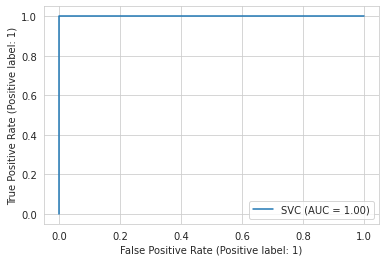

In [ ]:
# ROC curve
plot_roc_curve(model, x_valid, y_valid)

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


KFOLD CV

In [ ]:
acc = k_evaluate(10,model, new_data, y)  # here k 10

for fold: 2, accuracy is: 0.7777777777777778
for fold: 3, accuracy is: 0.8055555555555555
for fold: 4, accuracy is: 0.7916666666666666
for fold: 5, accuracy is: 0.8095238095238095
for fold: 6, accuracy is: 0.8333333333333334
for fold: 7, accuracy is: 0.8363636363636365
for fold: 8, accuracy is: 0.8333333333333333
for fold: 9, accuracy is: 0.8472222222222222
for fold: 10, accuracy is: 0.85
Best fit
10 gives accuracy of 0.85


##### LDA

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


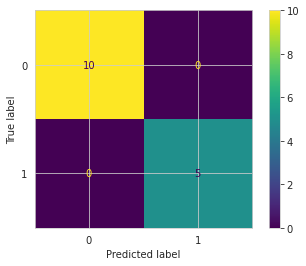

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(x_valid)

print(confusion_matrix(y_valid,lda_pred))
print('\n')
print(classification_report(y_valid,lda_pred))
plot_confusion_matrix(lda, x_valid, y_valid)

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


In [ ]:
#Kfold
acc = k_evaluate(10,lda, new_data, y)  # here k 10

for fold: 2, accuracy is: 0.8472222222222222
for fold: 3, accuracy is: 0.9305555555555557
for fold: 4, accuracy is: 0.875
for fold: 5, accuracy is: 0.9057142857142857
for fold: 6, accuracy is: 0.8888888888888888
for fold: 7, accuracy is: 0.9311688311688312
for fold: 8, accuracy is: 0.9166666666666666
for fold: 9, accuracy is: 0.9027777777777778
for fold: 10, accuracy is: 0.9321428571428572
Best fit
10 gives accuracy of 0.9321428571428572


##### Decision Tree

[[8 2]
 [0 5]]


              precision    recall  f1-score   support

           0       1.00      0.80      0.89        10
           1       0.71      1.00      0.83         5

    accuracy                           0.87        15
   macro avg       0.86      0.90      0.86        15
weighted avg       0.90      0.87      0.87        15



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


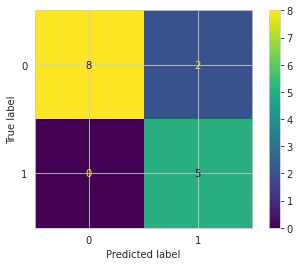

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)
dt.fit(x_train, y_train)
dt_pred = dt.predict(x_valid)

print(confusion_matrix(y_valid,dt_pred))
print('\n')
print(classification_report(y_valid,dt_pred))
plot_confusion_matrix(dt, x_valid, y_valid)

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

precision :  0.8 
 recall : 1.0 
 f1_score : 0.888888888888889


In [ ]:
#Kfold
acc = k_evaluate(10,dt, new_data, y)  # here k 10

for fold: 2, accuracy is: 0.8611111111111112
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.875
for fold: 5, accuracy is: 0.9028571428571428
for fold: 6, accuracy is: 0.861111111111111
for fold: 7, accuracy is: 0.903896103896104
for fold: 8, accuracy is: 0.861111111111111
for fold: 9, accuracy is: 0.8333333333333334
for fold: 10, accuracy is: 0.8749999999999998
Best fit
3 gives accuracy of 0.9166666666666666


##### Naive Bayes

In [ ]:
gnb_sel = GaussianNB()

# X_train = sc.fit_transform(X_train[:, selected_features])
# X_test = sc.transform(X_test[:, selected_features])
gnb_sel.fit(x_train, y_train)
gnb_pred = gnb_sel.predict(x_valid)
print('Model accuracy:', gnb_sel.score(x_valid, y_valid))


Model accuracy: 1.0


In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, gnb_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


[[10  0]
 [ 0  5]]


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


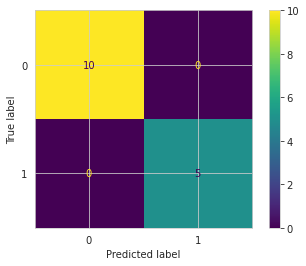

In [ ]:
print(confusion_matrix(y_valid,gnb_pred))
plot_confusion_matrix(gnb_sel, x_valid, y_valid)

In [ ]:
#Kfold
acc = k_evaluate(10,gnb_sel, new_data, y)  # here k 10

for fold: 2, accuracy is: 0.9722222222222222
for fold: 3, accuracy is: 1.0
for fold: 4, accuracy is: 0.9861111111111112
for fold: 5, accuracy is: 1.0
for fold: 6, accuracy is: 1.0
for fold: 7, accuracy is: 1.0
for fold: 8, accuracy is: 0.9861111111111112
for fold: 9, accuracy is: 0.9861111111111112
for fold: 10, accuracy is: 1.0
Best fit
3 gives accuracy of 1.0


###GWO

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from FS.gwo import jfs   # change this to switch algorithm

In [ ]:


# grab our features & Labels
y = data1['cancer']
y = y.values
x = data1.drop(['cancer','patient','dataset'], axis=1)
from sklearn.model_selection import train_test_split
x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size = 0.2, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
print("x_valid: ",x_valid.shape)
print("y_valid: ",y_valid.shape)

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_valid = sc.transform(x_valid)

x_train shape:  (57, 5327)
y_train shape:  (57,)
x_valid:  (15, 5327)
y_valid:  (15,)


In [ ]:
# parameter
k    = 5     # k-value in KNN
N    = 10    # number of chromosomes
T    = 100   # maximum number of generations
CR   = 0.8
MR   = 0.01
fold = {'xt':x_train, 'yt':y_train, 'xv':x_valid, 'yv':y_valid}
x = x.to_numpy()
opts = {'k':k, 'fold':fold, 'N':N, 'T':T, 'CR':CR, 'MR':MR}


In [ ]:
# Check for types of x and y wheather they are numpy.ndarray or not
# y = y.values
print(type(x))
print(type(y))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [ ]:
fmdl = jfs(x, y, opts)
sf   = fmdl['sf']

Iteration: 1
Best (GWO): 0.0048807959451849115
Iteration: 2
Best (GWO): 0.004683686878167829
Iteration: 3
Best (GWO): 0.004486577811150746
Iteration: 4
Best (GWO): 0.004291345973343349
Iteration: 5
Best (GWO): 0.004109254740003758
Iteration: 6
Best (GWO): 0.003906513985357615
Iteration: 7
Best (GWO): 0.0037244227520180245
Iteration: 8
Best (GWO): 0.003579876102872164
Iteration: 9
Best (GWO): 0.003455978975032855
Iteration: 10
Best (GWO): 0.003290782804580442
Iteration: 11
Best (GWO): 0.0031556223014830138
Iteration: 12
Best (GWO): 0.003091796508353673
Iteration: 13
Best (GWO): 0.002920968650272201
Iteration: 14
Best (GWO): 0.0028346161066266215
Iteration: 15
Best (GWO): 0.002753895250610102
Iteration: 16
Best (GWO): 0.002534259433076781
Iteration: 17
Best (GWO): 0.002534259433076781
Iteration: 18
Best (GWO): 0.00247043363994744
Iteration: 19
Best (GWO): 0.002402853388398726
Iteration: 20
Best (GWO): 0.0023221325323822062
Iteration: 21
Best (GWO): 0.00227144734372067
Iteration: 22
Best 

In [ ]:
# model with selected features
num_train = np.size(x_train, 0)
num_valid = np.size(x_valid, 0)
x_train   = x_train[:, sf]
y_train   = y_train.reshape(num_train)
x_valid   = x_valid[:, sf]
y_valid   = y_test.reshape(num_valid)

In [ ]:
f = fmdl['sf']   ## its 11
# featching features
features = []
for key, val in col_dict.items():
  if key in f:
    features.append(col_dict.get(key))

In [ ]:
len(features)

474

####SVC

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



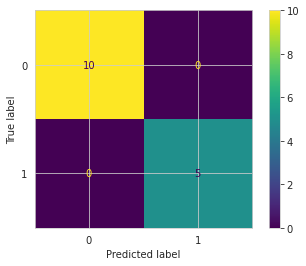

In [ ]:
# Model
model = SVC()
model.fit(x_train,y_train)
model_pred = model.predict(x_valid)

print(confusion_matrix(y_valid,model_pred))
print('\n')
print(classification_report(y_valid,model_pred))
plot_confusion_matrix(model, x_valid, y_valid)

In [ ]:
#Kfold
acc = k_evaluate(10,model, x[:, sf], y)  # here k 10

for fold: 2, accuracy is: 0.6805555555555556
for fold: 3, accuracy is: 0.7083333333333334
for fold: 4, accuracy is: 0.7222222222222222
for fold: 5, accuracy is: 0.7533333333333333
for fold: 6, accuracy is: 0.7638888888888888
for fold: 7, accuracy is: 0.7376623376623377
for fold: 8, accuracy is: 0.7638888888888888
for fold: 9, accuracy is: 0.75
for fold: 10, accuracy is: 0.7642857142857142
Best fit
10 gives accuracy of 0.7642857142857142


####LDA

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



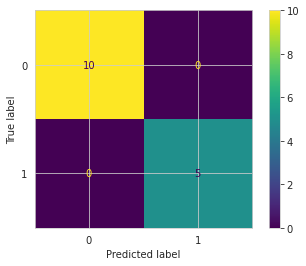

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(x_valid)

print(confusion_matrix(y_valid,lda_pred))
print('\n')
print(classification_report(y_valid,lda_pred))
plot_confusion_matrix(lda, x_valid, y_valid)

In [ ]:
#Kfold
acc = k_evaluate(10,lda, x[:, sf], y)  # here k 10

for fold: 2, accuracy is: 0.9305555555555556
for fold: 3, accuracy is: 0.9583333333333334
for fold: 4, accuracy is: 0.9444444444444444
for fold: 5, accuracy is: 0.9457142857142857
for fold: 6, accuracy is: 0.9444444444444443
for fold: 7, accuracy is: 0.974025974025974
for fold: 8, accuracy is: 0.9444444444444444
for fold: 9, accuracy is: 0.9444444444444444
for fold: 10, accuracy is: 0.9625
Best fit
7 gives accuracy of 0.974025974025974


####Decision Tree

[[6 4]
 [0 5]]


              precision    recall  f1-score   support

           0       1.00      0.60      0.75        10
           1       0.56      1.00      0.71         5

    accuracy                           0.73        15
   macro avg       0.78      0.80      0.73        15
weighted avg       0.85      0.73      0.74        15



/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



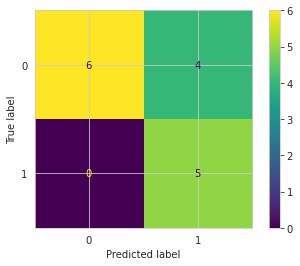

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)
dt.fit(x_train, y_train)
dt_pred = dt.predict(x_valid)

print(confusion_matrix(y_valid,dt_pred))
print('\n')
print(classification_report(y_valid,dt_pred))
plot_confusion_matrix(dt, x_valid, y_valid)

In [ ]:
#Kfold
acc = k_evaluate(10,dt, x[:, sf], y)  # here k 10

for fold: 2, accuracy is: 0.8472222222222222
for fold: 3, accuracy is: 0.888888888888889
for fold: 4, accuracy is: 0.888888888888889
for fold: 5, accuracy is: 0.8466666666666667
for fold: 6, accuracy is: 0.875
for fold: 7, accuracy is: 0.9441558441558442
for fold: 8, accuracy is: 0.9305555555555556
for fold: 9, accuracy is: 0.9166666666666666
for fold: 10, accuracy is: 0.9017857142857142
Best fit
7 gives accuracy of 0.9441558441558442


####Naive Bayes

In [ ]:
gnb_sel = GaussianNB()

gnb_sel.fit(x_train, y_train)
gnb_pred = gnb_sel.predict(x_valid)
print('Model accuracy:', gnb_sel.score(x_valid, y_valid))


Model accuracy: 1.0


In [ ]:
#Kfold
acc = k_evaluate(10,gnb_sel, x[:, sf], y)  # here k 10

for fold: 2, accuracy is: 0.9444444444444444
for fold: 3, accuracy is: 0.9861111111111112
for fold: 4, accuracy is: 0.9861111111111112
for fold: 5, accuracy is: 0.9723809523809525
for fold: 6, accuracy is: 0.986111111111111
for fold: 7, accuracy is: 0.987012987012987
for fold: 8, accuracy is: 0.9861111111111112
for fold: 9, accuracy is: 0.9861111111111112
for fold: 10, accuracy is: 0.9875
Best fit
10 gives accuracy of 0.9875


## Hybrid GWO(GWO + JAYA)

### Implementation

In [ ]:
from FS.GWOJA import jfs   # change this to switch algorithm

In [ ]:

# grab our features
y = data1['cancer']
Y = y.values
x = data1.drop(['cancer','patient','dataset'], axis=1)
X = x.to_numpy()
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 101)
print("x_train shape: ", x_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",x_test.shape)
print("y_test: ",y_test.shape)

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

x_train shape:  (57, 5327)
y_train shape:  (57,)
x_text:  (15, 5327)
y_test:  (15,)


In [ ]:
# parameter
k    = 5     # k-value in KNN
N    = 10    # number of chromosomes
T    = 100   # maximum number of generations
CR   = 0.8
MR   = 0.01
fold = {'xt':x_train, 'yt':y_train, 'xv':x_test, 'yv':y_test}

opts = {'k':k, 'fold':fold, 'N':N, 'T':T, 'CR':CR, 'MR':MR}

In [ ]:
# Check for types of x and y wheather they are numpy.ndarray or not
# y = y.values
print(type(X))
print(type(Y))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [ ]:
fmdl = jfs(X, Y, opts)
sf   = fmdl['sf']

Iteration: 1
Best (GWO): 0.004929603904636761
Iteration: 2
Best (GWOJA): 0.004687441336587201
Iteration: 3
Best (GWOJA): 0.004477191665102313
Iteration: 4
Best (GWOJA): 0.004413365871972972
Iteration: 5
Best (GWOJA): 0.004154308241036234
Iteration: 6
Best (GWOJA): 0.0040172705087291195
Iteration: 7
Best (GWOJA): 0.0038877416932607506
Iteration: 8
Best (GWOJA): 0.003730054439647084
Iteration: 9
Best (GWOJA): 0.0035198047681621954
Iteration: 10
Best (GWOJA): 0.0033921531819035137
Iteration: 11
Best (GWOJA): 0.00320067580251549
Iteration: 12
Best (GWOJA): 0.0031349727801764623
Iteration: 13
Best (GWOJA): 0.0029979350478693476
Iteration: 14
Best (GWOJA): 0.002885301295288157
Iteration: 15
Best (GWOJA): 0.0027426318753519833
Iteration: 16
Best (GWOJA): 0.00265815656091609
Iteration: 17
Best (GWOJA): 0.002596207996996435
Iteration: 18
Best (GWOJA): 0.0024666791815280667
Iteration: 19
Best (GWOJA): 0.0024103623052374717
Iteration: 20
Best (GWOJA): 0.0023502909705275035
Iteration: 21
Best (GWO

In [ ]:
# model with selected features
num_train = np.size(x_train, 0)
num_valid = np.size(x_test, 0)
x_train   = x_train[:, sf]
y_train   = y_train.reshape(num_train)  # Solve bug
x_valid   = x_test[:, sf]
y_valid   = y_test.reshape(num_valid)  # Solve bug

In [ ]:
f = fmdl['sf']
print("Lenght of features: ", len(f))
# featching features
features = []
for key, val in col_dict.items():
  if key in f:
    features.append(col_dict.get(key))
len(features)

Lenght of features:  602


602

<Axes: >

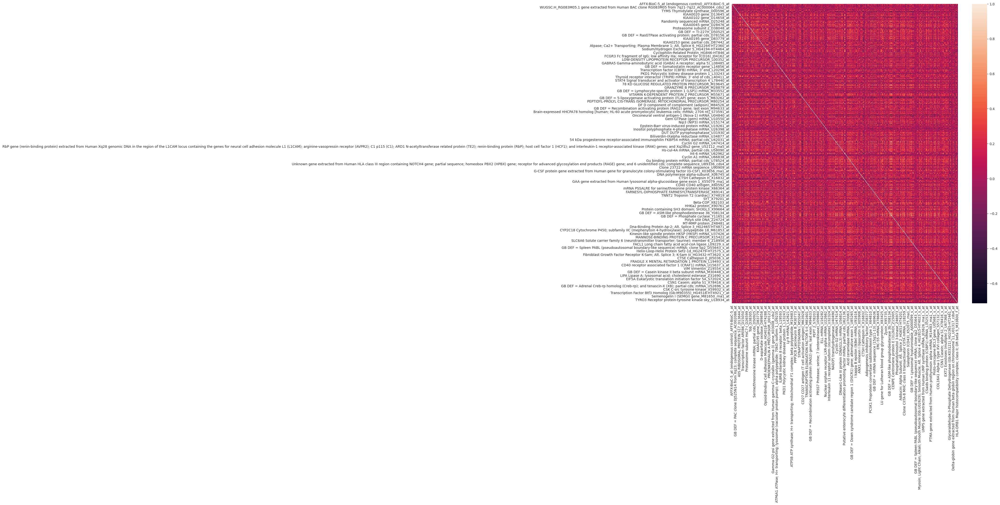

In [ ]:
cor = data1[features].corr()
plt.figure(figsize=(15,16))
sns.heatmap(cor)

In [ ]:
# Creating new dataset for KFold
new_data_gj = x[features]
new_data_gj

,AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at,AFFX-DapX-M_at (endogenous control)_AFFX-DapX-M_at,AFFX-HUMRGE/M10098_M_at (endogenous control)_AFFX-HUMRGE/M10098_M_at,AFFX-HUMTFRR/M11507_M_at (endogenous control)_AFFX-HUMTFRR/M11507_M_at,AFFX-HUMGAPDH/M33197_M_st (endogenous control)_AFFX-HUMGAPDH/M33197_M_st,GB DEF = GABAa receptor alpha-3 subunit_A28102_at,SH3 binding protein; clone RES4-23A_AB000462_at,WUGSC:H_RG083M05.1 gene extracted from Human BAC clone RG083M05 from 7q21-7q22_AC000064_cds2_at,GB DEF = BAC clone RG293F11 from 7q21-7q22; complete sequence_AC000066_at,Metabotropic glutamate receptor 8 mRNA_AC000099_at,...,HLA CLASS I HISTOCOMPATIBILITY ANTIGEN; F ALPHA CHAIN PRECURSOR_X17093_at,NGAL gene_X99133_at,GB DEF = Chloride channel (putative) 2139bp_Z30643_at,TYRO3 Receptor protein-tyrosine kinase sky_U18934_at,ALPHA-CENTRACTIN_Z14978_at,GB DEF = DNA sequence from PAC 151B14 on chromosome 22q12-qter contains somatostatin receptor subtype 3 (SSTR3); tRNA; ESTs; CpG island and STS_Z86000_at,MELANOMA-ASSOCIATED ANTIGEN 2_L18920_f_at,INTERFERON ALPHA-4 PRECURSOR_M27318_f_at,HLA-DRB1 Major histocompatibility complex; class II; DR beta 5_M33600_f_at,GAPD Glyceraldehyde-3-phosphate dehydrogenase_X01677_f_at
0,88,311,9738,70,132,151,137,78,32,245,...,5956,-685,1619,-60,806,538,45,115,13537,13771
1,283,134,115,153,301,263,188,142,42,125,...,1234,-592,1457,-15,470,863,-14,0,3319,15097
2,309,378,3272,66,524,88,91,205,2,124,...,830,-1092,1528,-77,1270,737,193,4,552,17378
3,12,268,2293,-54,-76,484,-82,142,-26,99,...,1252,-325,1384,-40,554,882,190,68,3529,13818
4,168,118,2731,78,89,118,204,85,-23,89,...,1449,-127,798,-14,-106,386,39,15,4240,15619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67,141,46,-159,93,7,316,60,237,-74,85,...,1049,236,1566,-89,-108,547,117,189,10027,17825
68,95,73,478,119,65,228,73,99,-23,-41,...,3368,-49,999,8,26,295,73,-15,3057,15852
69,146,302,2164,16,379,395,318,142,-60,80,...,2860,-360,2411,-14,919,641,87,83,18177,14331
70,431,235,-745,-56,-390,311,92,254,16,233,...,4109,-238,1547,-59,1024,1531,35,5,6422,18830


### Classification

#### SVC

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



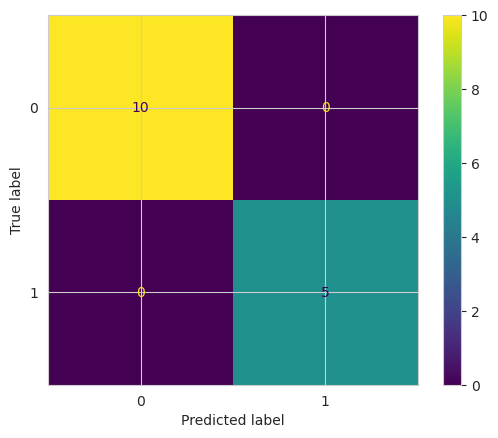

In [ ]:
# Model
model = SVC()
model.fit(x_train,y_train)
model_pred = model.predict(x_valid)
cm = confusion_matrix(y_valid,model_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
disp.plot()

print('\n')
print(classification_report(y_valid,model_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

#Kfold
acc = k_evaluate(10,model, new_data_gj, y)  # here k 10

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 0.8611111111111112
for fold: 3, accuracy is: 0.888888888888889
for fold: 4, accuracy is: 0.8888888888888888
for fold: 5, accuracy is: 0.9047619047619048
for fold: 6, accuracy is: 0.9166666666666666
for fold: 7, accuracy is: 0.9181818181818182
for fold: 8, accuracy is: 0.9166666666666666
for fold: 9, accuracy is: 0.9027777777777778
for fold: 10, accuracy is: 0.9035714285714285
Best fit
7 gives accuracy of 0.9181818181818182


#### LDA

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



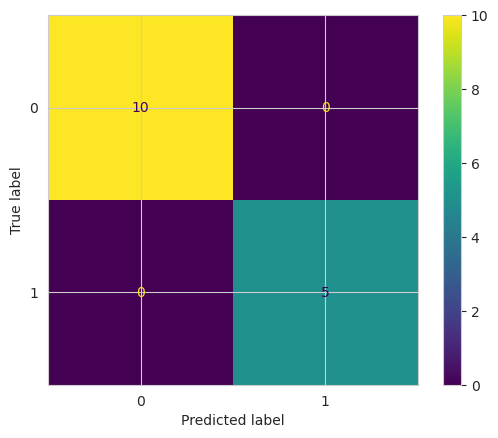

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(x_valid)
confusion_matrix(y_valid,lda_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()
print('\n')
print(classification_report(y_valid,lda_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

#Kfold
acc = k_evaluate(10,lda, new_data_gj, y)  # here k 10

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 0.9166666666666666
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.9305555555555556
for fold: 5, accuracy is: 0.9457142857142857
for fold: 6, accuracy is: 0.9305555555555555
for fold: 7, accuracy is: 0.9311688311688312
for fold: 8, accuracy is: 0.9583333333333333
for fold: 9, accuracy is: 0.9305555555555556
for fold: 10, accuracy is: 0.9464285714285715
Best fit
8 gives accuracy of 0.9583333333333333


#### Decision Tree

[[10  0]
 [ 2  3]]


              precision    recall  f1-score   support

           0       0.83      1.00      0.91        10
           1       1.00      0.60      0.75         5

    accuracy                           0.87        15
   macro avg       0.92      0.80      0.83        15
weighted avg       0.89      0.87      0.86        15



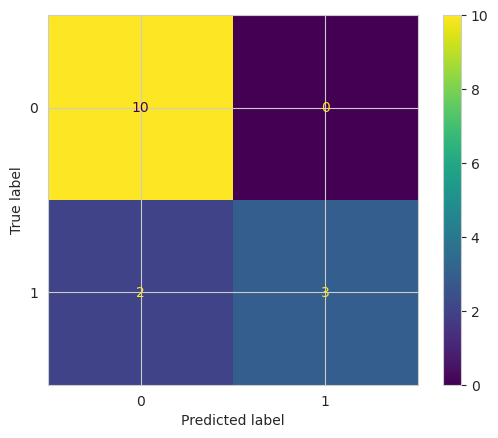

In [ ]:
dt = DecisionTreeClassifier(criterion='entropy', random_state=0)
dt.fit(x_train, y_train)
dt_pred = dt.predict(x_valid)
cm = confusion_matrix(y_valid,dt_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()
print('\n')
print(classification_report(y_valid,dt_pred))


In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_valid, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

#Kfold
acc = k_evaluate(10,dt, new_data_gj, y)  # here k 10

precision :  1.0 
 recall : 0.8333333333333334 
 f1_score : 0.9090909090909091
for fold: 2, accuracy is: 0.9444444444444444
for fold: 3, accuracy is: 0.875
for fold: 4, accuracy is: 0.861111111111111
for fold: 5, accuracy is: 0.8200000000000001
for fold: 6, accuracy is: 0.861111111111111
for fold: 7, accuracy is: 0.8896103896103896
for fold: 8, accuracy is: 0.8333333333333333
for fold: 9, accuracy is: 0.8333333333333334
for fold: 10, accuracy is: 0.8517857142857143
Best fit
2 gives accuracy of 0.9444444444444444


#### Naive Bayes

[[9 1]
 [0 5]]


              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       0.83      1.00      0.91         5

    accuracy                           0.93        15
   macro avg       0.92      0.95      0.93        15
weighted avg       0.94      0.93      0.93        15



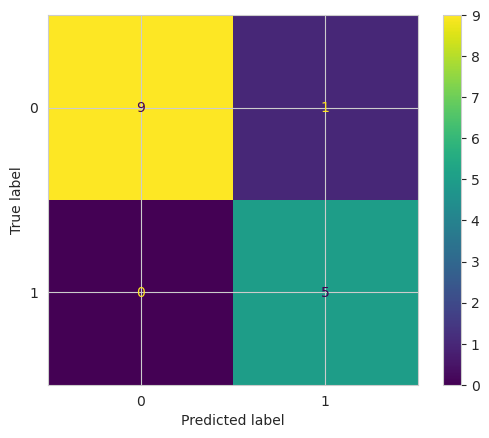

In [ ]:
gnb = GaussianNB()
gnb.fit(x_train, y_train)

y_pred = gnb.predict(x_valid)
cm = confusion_matrix(y_valid,y_pred)
print(cm)
print('\n')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_valid,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, gnb,new_data_gj, y)

precision :  0.9 
 recall : 1.0 
 f1_score : 0.9473684210526316
for fold: 2, accuracy is: 0.9305555555555556
for fold: 3, accuracy is: 0.9583333333333334
for fold: 4, accuracy is: 0.9583333333333333
for fold: 5, accuracy is: 0.9457142857142857
for fold: 6, accuracy is: 0.9583333333333334
for fold: 7, accuracy is: 0.9454545454545454
for fold: 8, accuracy is: 0.9444444444444444
for fold: 9, accuracy is: 0.9583333333333334
for fold: 10, accuracy is: 0.9589285714285716
Best fit
10 gives accuracy of 0.9589285714285716


#### Random Forest

[[10  0]
 [ 0  5]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00         5

    accuracy                           1.00        15
   macro avg       1.00      1.00      1.00        15
weighted avg       1.00      1.00      1.00        15



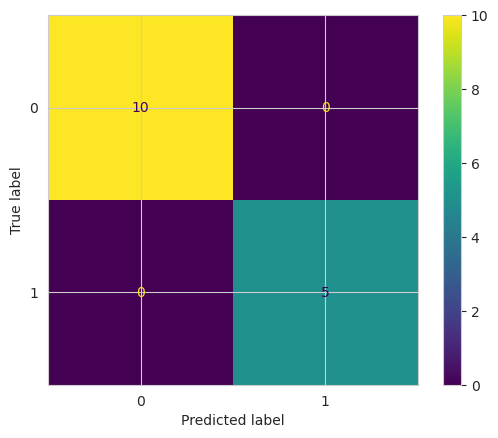

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(x_train, y_train)
y_pred = rf_classifier.predict(x_valid)


cm = confusion_matrix(y_valid,y_pred)
print(cm)
print('\n')
print(classification_report(y_valid,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier,new_data_gj, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.9305555555555556
for fold: 3, accuracy is: 0.9305555555555555
for fold: 4, accuracy is: 0.9444444444444444
for fold: 5, accuracy is: 0.959047619047619
for fold: 6, accuracy is: 0.9444444444444443
for fold: 7, accuracy is: 0.9454545454545455
for fold: 8, accuracy is: 0.9583333333333333
for fold: 9, accuracy is: 0.9583333333333334
for fold: 10, accuracy is: 0.9589285714285716
Best fit
5 gives accuracy of 0.959047619047619


## Support Vector Machines (SVM) with Recursive Feature Elimination (RFE): SVM-RFE

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.metrics import accuracy_score

# grab our features
x = data1.drop(['cancer','patient','dataset'], axis=1)
# Split data
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)
svm_classifier = SVC(kernel="linear")

In [ ]:
# Create the RFE object
num_features_to_select = 100  # Number of features to select
rfe = RFE(estimator=svm_classifier, n_features_to_select=num_features_to_select)


# Fit RFE to the training data
# This will take time
rfe.fit(X_train, y_train)


RFE(estimator=SVC(kernel='linear'), n_features_to_select=100)

In [ ]:
# Get the selected feature indices
selected_feature_indices = rfe.support_

In [ ]:
# Grab our features
def get_features(selected_feature_indices):
    # convert indeses to dictionary
    feat_idxs = dict(enumerate((selected_feature_indices).flatten(), 0)) # selected_feature_indices - numpy array
    selected_feature = []
    for key, val in col_dict.items():  # col_dict - dict containing features as vales and indces as keys
        for k, v in feat_idxs.items():
            if key == k and v != False:
                selected_feature.append(col_dict.get(key))
    return selected_feature

In [ ]:
selected_feature = get_features(selected_feature_indices)

In [ ]:
# get train and test set
X_train_selected = X_train[selected_feature]
X_test_selected = X_test[selected_feature]

#Train the SVM classifier on the selected features
svm_classifier.fit(X_train_selected, y_train)

# Make predictions on the testing data
y_pred = svm_classifier.predict(X_test_selected)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

print("########## Accuracy with K-FOLD #########")
acc = k_evaluate(10, svm_classifier, x[selected_feature], y)

Accuracy: 1.00
########## Accuracy with K-FOLD #########
for fold: 2, accuracy is: 1.0
for fold: 3, accuracy is: 1.0
for fold: 4, accuracy is: 1.0
for fold: 5, accuracy is: 1.0
for fold: 6, accuracy is: 1.0
for fold: 7, accuracy is: 1.0
for fold: 8, accuracy is: 1.0
for fold: 9, accuracy is: 1.0
for fold: 10, accuracy is: 1.0
Best fit
2 gives accuracy of 1.0


[[16  0]
 [ 0  6]]


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        16
           1       1.00      1.00      1.00         6

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22



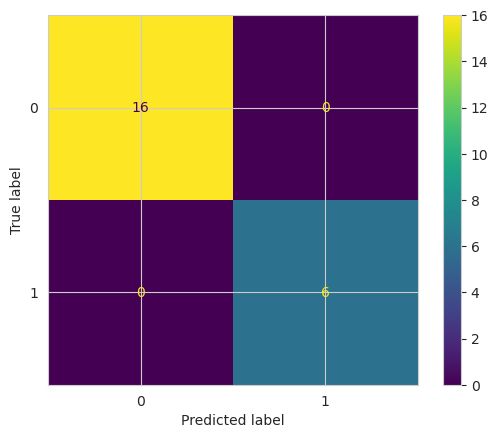

In [ ]:
cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=svm_classifier.classes_)
disp.plot()
print(classification_report(y_test,y_pred))


## Hybrid GWOPSO

### Implementation

In [ ]:
# Error rate & Feature size
def Fun(xtrain, ytrain, x, opts):
    # Parameters
    alpha    = 0.99
    beta     = 1 - alpha
    # Original feature size
    max_feat = len(x)
    # Number of selected features
    num_feat = np.sum(x == 1)
    # Solve if no feature selected
    if num_feat == 0:
        cost  = 1
    else:
        # Get error rate
        error = error_rate(xtrain, ytrain, x, opts)
        # Objective function
        cost  = alpha * error + beta * (num_feat / max_feat)

    return cost

def fjob(x):
    term1 = (x[0] + x[1] + 1)**2 * (19 - 14*x[0] + 3*x[0]**2 - 14*x[1] + 6*x[0]*x[1] + 3*x[1]**2)
    term2 = (2*x[0] - 3*x[1])**2 * (18 - 32*x[0] + 12*x[0]**2 + 48*x[1] - 36*x[0]*x[1] + 27*x[1]**2)
    o = (1 + term1) * (30 + term2)
    return o

def init_position(lb, ub, N, dim):
  X = np.zeros([N, dim], dtype='float')
  for i in range(N):
      for d in range(dim):
          X[i,d] = lb[0,d] + (ub[0,d] - lb[0,d]) * np.random.rand()

  return X

def Get_Functions_details(xtrain):
    lb = -2
    ub = 2
    dim = 2
    dim = np.size(xtrain, 1)
    if np.size(lb) == 1:
        ub = ub * np.ones((1, 2), dtype='float')
        lb = lb * np.ones((1, 2), dtype='float')

    return [lb,ub,dim]

def binary_conversion(X, thres, num_particles, dim):
  Xbin = np.zeros([num_particles, dim], dtype='int')
  for i in range(num_particles):
      for d in range(dim):
          if X[i,d] > thres:
              Xbin[i,d] = 1
          else:
              Xbin[i,d] = 0

  return Xbin

def boundary(x, lb, ub):
  if x < lb:
      x = lb
  if x > ub:
      x = ub
  return x

In [ ]:
def GWOPSO(num_particles,Max_iter, num_features, lb, ub, xtrain):
    dim = np.size(xtrain, 1)
    Alpha_pos = np.zeros((1, dim))
    Alpha_score= float('inf')
    Beta_pos= np.zeros((1,dim))
    Beta_score= float('inf')
    Delta_pos= np.zeros((1,dim))
    Delta_score= float('inf')
    fitGP = float('inf')  # fitness GWO-PSO
    lb = -2
    ub = 2
    thres = 0.5

    # Positions= init_position(lb, ub, num_particles, dim)
    # print("Positions shape: ",Positions.shape)
    Convergence_curve= np.zeros((1,Max_iter))
    # velocity = 0.3*np.random.randn(num_particles,dim)
    # print("Velocity shape: ",velocity.shape)
    # Initialize particle positions and velocities
    Positions = np.random.uniform(-1, 1, (num_particles, dim))
    Positions_P = np.random.uniform(-1, 1, (num_particles, dim))
    Positions_B =  binary_conversion(Positions, thres, num_particles, dim)
    print("Positions shape: ",Positions.shape)
    velocity = np.random.uniform(-0.1, 0.1, (num_particles, dim))
    print("Velocity shape: ",velocity.shape)
    w = 0.5 + np.random.rand()/2;
    # w = 0.5
    l = 0 # Loop counter
    fitP    = np.zeros([num_particles, 1], dtype='float') # Fitness PSO
    XgbP   = np.zeros([1, dim], dtype='float')

    print("fitP dimension", fitP.shape)
    print("Positions_B dimension", Positions_B.shape)
    print("XgbP dimension", XgbP.shape)
    print("Positions_p dimension", Positions_P.shape)


    #Xbin = binary_conversion(Positions, thres, N, dim)
    if np.size(lb) == 1:
        ub = ub * np.ones([1, dim], dtype='float')
        lb = lb * np.ones([1, dim], dtype='float')
    for i in range(num_particles):
        fitP[i,0] = fjob(Positions_B[i,:])
        if fitP[i,0] < fitGP:
            XgbP[0,:] = Positions_P[i,:]
            fitGP     = fitP[i,0]


    while l < Max_iter:
        for i in range(Positions.shape[0]):
            # print("Enter lopp:", i)
            # Return back the search agents that go beyond the boundaries of the search space
            # Flag4ub=Positions[i,:]>2
            # Flag4lb=Positions[i,:]<-2
            # cond_ub = Flag4ub > 0
            # cond_lb = Flag4lb > 0

            # # Apply the operations using NumPy
            # Positions[i:,] = Positions[i,:] * np.logical_not(Flag4ub + Flag4lb) + ub * Flag4ub + lb * Flag4lb
            # Positions[i,:]=(Positions[i,:] * ((Flag4ub+Flag4lb)))+ub * Flag4ub+lb * Flag4lb

            # Calculate objective function for each search agent
            fitness=fjob(Positions[i,:])

            # Update Alpha, Beta, and Delta
            if fitness<Alpha_score:
                Alpha_score=fitness # Update alpha
                Alpha_pos=Positions[i,:]


            if fitness>Alpha_score and fitness<Beta_score:
                Beta_score=fitness # Update beta
                Beta_pos=Positions[i,:]


            if fitness>Alpha_score and fitness>Beta_score and fitness<Delta_score:
                Delta_score=fitness # Update delta
                Delta_pos=Positions[i,:]



        a=2-l*((2)/Max_iter) # a decreases linearly fron 2 to 0

        # Update the Position of search agents including omegas
        for i in range(Positions.shape[0]):
            for j in range(Positions.shape[1]):

                r1 = np.random.rand(); # r1 is a random number in [0,1]
                r2 = np.random.rand()  # r2 is a random number in [0,1]

                A1 = 2*a*r1-a  # Equation (3.3)
                #C1=2*r2; # Equation (3.4)
                C1 = 0.5

                D_alpha = abs(C1*Alpha_pos[j] - w*Positions[i,j]); # Equation (3.5)-part 1
                X1 = Alpha_pos[j] - A1*D_alpha  # Equation (3.6)-part 1

                r1 = np.random.rand()
                r2 = np.random.rand()

                A2  =2*a*r1-a; # Equation (3.3)
                #C2=2*r2; # Equation (3.4)
                C2 = 0.5

                D_beta = abs(C2*Beta_pos[j] - w*Positions[i,j]) # Equation (3.5)-part 2
                X2 = Beta_pos[j] - A2*D_beta # Equation (3.6)-part 2

                r1=np.random.rand()
                r2=np.random.rand()
                r3=np.random.rand()
                A3=2*a*r1-a  # Equation (3.3)
                #C3=2*r2; # Equation (3.4)
                C3 = 0.5
                D_delta = abs(C3*Delta_pos[j] - w*Positions[i,j])  # Equation (3.5)-part 3
                X3 = Delta_pos[j] - A3*D_delta  # Equation (3.5)-part 3

                #velocity[i,j] = w * (velocity[i,j] + C1*r1*(X1-Positions[i,j]) + C2*r2*(X2-Positions[i,j]) + C3*r3*(X3-Positions[i,j]))
                velocity[i, j] = w * (velocity[i, j] + C1 * r1 * (X1 - Positions[i, j]) + C2 * r2 * (X2 - Positions[i, j]) + C3 * r3 * (X3 - Positions[i, j]))

                # positions update
                Positions[i,j]=Positions[i,j]+velocity[i,j]
                # Boundary
                Positions[i,j] = boundary(Positions[i,j], lb[0,j], ub[0,j])

        # Binary conversion
        #Xjbin = binary_conversion(Positions, thres, num_particles, dim)
        # Binary conversion
        Xjbin = binary_conversion(Positions, thres, num_particles, dim)
        # Greedy selection
        for i in range(num_particles):
            print("Greedy sel loop:", i)
            Fnew = fjob(Xjbin[i,:])
            if Fnew < fitP[i,0]:
                Positions_P[i,:]   = Positions[i,:]
                fitP[i,0] = Fnew

            if fitP[i,0] < fitGP:
                XgbP[0,:] = Positions_p[i,:]
                fitGP     = fitP[i,0]

        print("max_iter:", l) # progress
        l = l+1
        # Convergence_curve[l]=Alpha_score;


    return [Alpha_score,Alpha_pos,XgbP]

In [ ]:
num_particles = 30
Max_iter =100
num_features = 100
dim = np.size(X, 1)

lb = -2
ub = 2
# dim = 2
[lb,ub,dim]=Get_Functions_details(X_train)

In [ ]:
[Best_score,Best_pos,XgbP] = GWOPSO(num_particles, Max_iter,num_features, lb, ub, X)

Positions shape:  (30, 5327)
Velocity shape:  (30, 5327)
fitP dimension (30, 1)
Positions_B dimension (30, 5327)
XgbP dimension (1, 5327)
Positions_p dimension (30, 5327)
Greedy sel loop: 0
Greedy sel loop: 1
Greedy sel loop: 2
Greedy sel loop: 3
Greedy sel loop: 4
Greedy sel loop: 5
Greedy sel loop: 6
Greedy sel loop: 7
Greedy sel loop: 8
Greedy sel loop: 9
Greedy sel loop: 10
Greedy sel loop: 11
Greedy sel loop: 12
Greedy sel loop: 13
Greedy sel loop: 14
Greedy sel loop: 15
Greedy sel loop: 16
Greedy sel loop: 17
Greedy sel loop: 18
Greedy sel loop: 19
Greedy sel loop: 20
Greedy sel loop: 21
Greedy sel loop: 22
Greedy sel loop: 23
Greedy sel loop: 24
Greedy sel loop: 25
Greedy sel loop: 26
Greedy sel loop: 27
Greedy sel loop: 28
Greedy sel loop: 29
max_iter: 0
Greedy sel loop: 0
Greedy sel loop: 1
Greedy sel loop: 2
Greedy sel loop: 3
Greedy sel loop: 4
Greedy sel loop: 5
Greedy sel loop: 6
Greedy sel loop: 7
Greedy sel loop: 8
Greedy sel loop: 9
Greedy sel loop: 10
Greedy sel loop: 

In [ ]:
XgbP.shape

(1, 5327)

In [ ]:
def binary_conversion2(X, thres, num_particles, dim):
    Xbin = np.zeros([num_particles, dim], dtype='int')
    print("Xbin shape", Xbin.shape)
    # if len(X.shape) == 1:  # If X has a single row, convert it to a 2D array
    #     X = X.reshape(1, -1)
    for i in range(num_particles):
      for d in range(dim):
          if X[i,d] > thres:
              Xbin[i,d] = 1
          else:
              Xbin[i,d] = 0

    return Xbin

In [ ]:
#Best feature subset
Gbin       = binary_conversion(XgbP, 0.5, 1, dim)
Gbin       = Gbin.reshape(dim)
pos        = np.asarray(range(0, dim))
sel_index  = pos[Gbin == 1]
num_feat   = len(sel_index)
# Create dictionary
gwo_data = {'sf': sel_index, 'nf': num_feat}

In [ ]:
f = sel_index
# featching features
features = []
for key, val in col_dict.items():
  if key in f:
    features.append(col_dict.get(key))

### Correlation matrix

<Axes: >

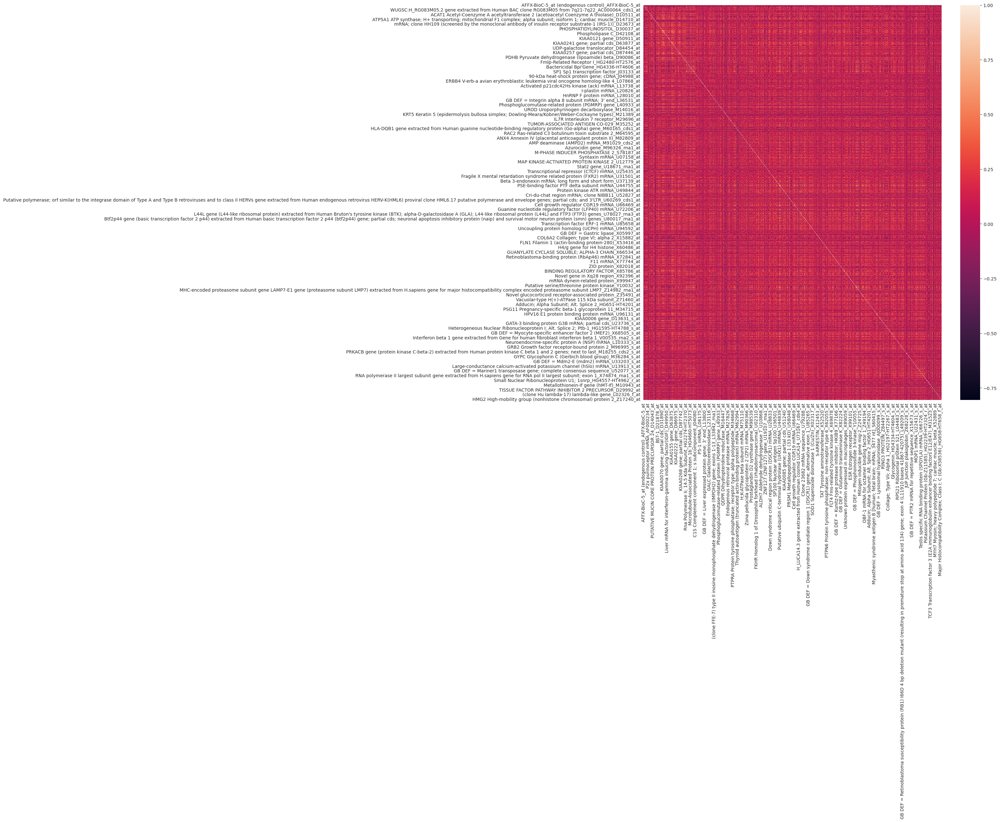

In [ ]:
cor = data1[features].corr()
plt.figure(figsize=(15,16))
sns.heatmap(cor)

### Data Creation

In [ ]:
len(features)

634

In [ ]:
new_x = x[features]
new_x.head()

,AFFX-BioC-5_at (endogenous control)_AFFX-BioC-5_at,hum_alu_at (miscellaneous control)_hum_alu_at,AFFX-LysX-5_at (endogenous control)_AFFX-LysX-5_at,AFFX-HUMGAPDH/M33197_3_at (endogenous control)_AFFX-HUMGAPDH/M33197_3_at,AFFX-HSAC07/X00351_5_at (endogenous control)_AFFX-HSAC07/X00351_5_at,AFFX-HUMTFRR/M11507_3_at (endogenous control)_AFFX-HUMTFRR/M11507_3_at,AFFX-M27830_M_at (endogenous control)_AFFX-M27830_M_at,AFFX-HUMGAPDH/M33197_M_st (endogenous control)_AFFX-HUMGAPDH/M33197_M_st,AFFX-HUMGAPDH/M33197_3_st (endogenous control)_AFFX-HUMGAPDH/M33197_3_st,AFFX-HSAC07/X00351_M_st (endogenous control)_AFFX-HSAC07/X00351_M_st,...,GB DEF = Thyrotroph embryonic factor (TEF) mRNA_U44059_at,Histamine N-methyltransferase_U44111_at,PSE-binding factor PTF delta subunit mRNA_U44755_at,GB DEF = Nuclear respiratory factor 1 (NRF-1) mRNA; 3' UTR_U44848_at,X-linked inhibitor of apotosis protein XIAP mRNA_U45880_at,Phosphatidylinositol (4;5) bisphosphate 5-phosphatase homolog mRNA; partial cds_U45974_at,MTM1 Myotubular myopathy 1_U46024_at,Chromosome 16p11.2 BAC Clone CIT987SK-234F9 complete sequence_U46025_at,Cystatin B gene_U46692_rna1_at,NifU-like protein (hNifU) mRNA; partial cds_U47101_at
0,88,15091,21,17782,16287,298,6559,132,546,336,...,1045,35,513,271,262,1252,219,2696,662,582
1,283,11038,-21,18112,17926,285,3824,301,530,418,...,914,56,555,233,56,1131,90,2193,2998,1447
2,309,16692,67,23006,22626,187,3349,524,911,761,...,1184,-6,732,257,208,1227,-112,2312,2533,611
3,12,15763,43,17633,15770,260,2442,-76,327,511,...,744,-18,631,269,63,1218,30,3155,1049,490
4,168,18128,-8,17384,16386,287,1056,89,120,65,...,711,23,253,89,59,785,140,2594,1637,1014


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(new_x, y, test_size = 0.3, random_state = 101)
print("x_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",X_test.shape)
print("y_test: ",y_test.shape)

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(X_train)
x_test = sc.transform(X_test)

x_train shape:  (50, 634)
y_train shape:  (50,)
x_text:  (22, 634)
y_test:  (22,)


### Classification

#### SVC

[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        15
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22



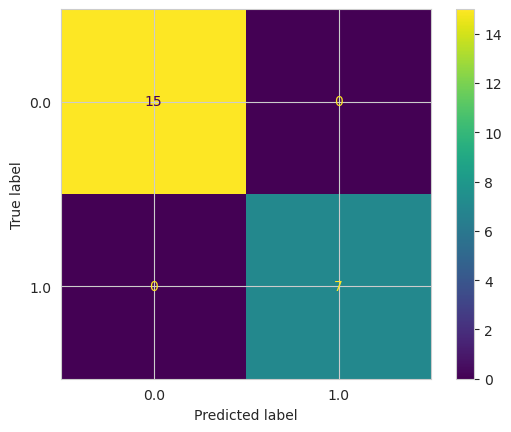

In [ ]:
model_SVC= SVC()
model_SVC.fit(x_train,y_train)
model_pred = model_SVC.predict(x_test)
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_SVC.classes_)
disp.plot()
print(classification_report(y_test,model_pred))


In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, model_SVC, new_x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 0.75
for fold: 3, accuracy is: 0.8194444444444445
for fold: 4, accuracy is: 0.8333333333333334
for fold: 5, accuracy is: 0.8628571428571428
for fold: 6, accuracy is: 0.875
for fold: 7, accuracy is: 0.8779220779220779
for fold: 8, accuracy is: 0.9027777777777777
for fold: 9, accuracy is: 0.9027777777777778
for fold: 10, accuracy is: 0.8910714285714285
Best fit
9 gives accuracy of 0.9027777777777778


### LDA

[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        15
         1.0       0.32      1.00      0.48         7

    accuracy                           0.32        22
   macro avg       0.16      0.50      0.24        22
weighted avg       0.10      0.32      0.15        22



/home/alice/anaconda3/envs/dude/lib/python3.10/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but LinearDiscriminantAnalysis was fitted without feature names
  warnings.warn(
/home/alice/anaconda3/envs/dude/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/alice/anaconda3/envs/dude/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/alice/anaconda3/envs/dude/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision a

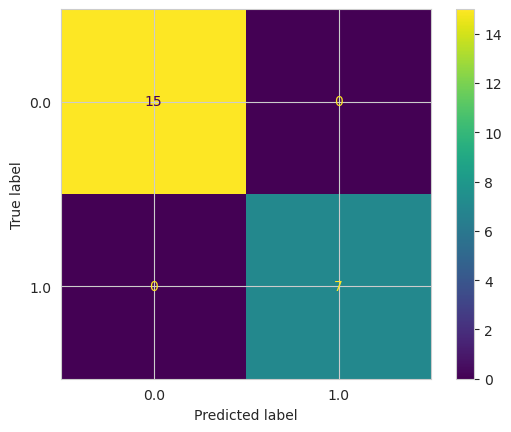

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(x_train,y_train)
lda_pred = lda.predict(X_test)
confusion_matrix(y_test,lda_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()
print('\n')
print(classification_report(y_test,lda_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

#Kfold
acc = k_evaluate(10,lda, new_data_gj, y)  # here k 10

precision :  0.0 
 recall : nan 
 f1_score : nan


/tmp/ipykernel_550/4135873000.py:14: RuntimeWarning: invalid value encountered in scalar divide
  recall = True_Positives / (True_Positives + False_Negetives)


for fold: 2, accuracy is: 0.9166666666666666
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.9305555555555556
for fold: 5, accuracy is: 0.9457142857142857
for fold: 6, accuracy is: 0.9305555555555555
for fold: 7, accuracy is: 0.9311688311688312
for fold: 8, accuracy is: 0.9583333333333333
for fold: 9, accuracy is: 0.9305555555555556
for fold: 10, accuracy is: 0.9464285714285715
Best fit
8 gives accuracy of 0.9583333333333333


### Naive Bayes

[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        15
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22



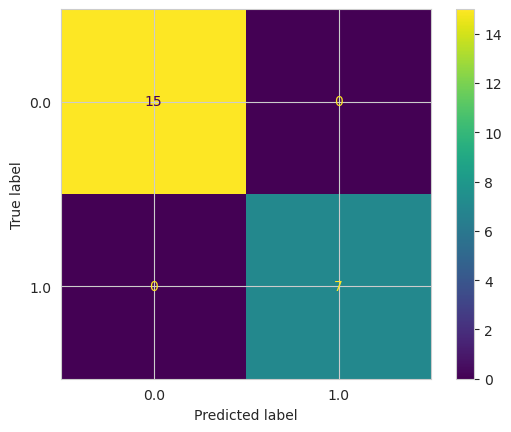

In [ ]:
gnb = GaussianNB()
gnb.fit(x_train, y_train)

y_pred = gnb.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_test,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, gnb, new_x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 1.0
for fold: 3, accuracy is: 0.9861111111111112
for fold: 4, accuracy is: 0.9861111111111112
for fold: 5, accuracy is: 0.9723809523809525
for fold: 6, accuracy is: 0.986111111111111
for fold: 7, accuracy is: 0.9727272727272727
for fold: 8, accuracy is: 0.9722222222222222
for fold: 9, accuracy is: 0.9722222222222222
for fold: 10, accuracy is: 0.9732142857142858
Best fit
2 gives accuracy of 1.0


### Decision Tree

[[12  3]
 [ 2  5]]


              precision    recall  f1-score   support

         0.0       0.86      0.80      0.83        15
         1.0       0.62      0.71      0.67         7

    accuracy                           0.77        22
   macro avg       0.74      0.76      0.75        22
weighted avg       0.78      0.77      0.78        22



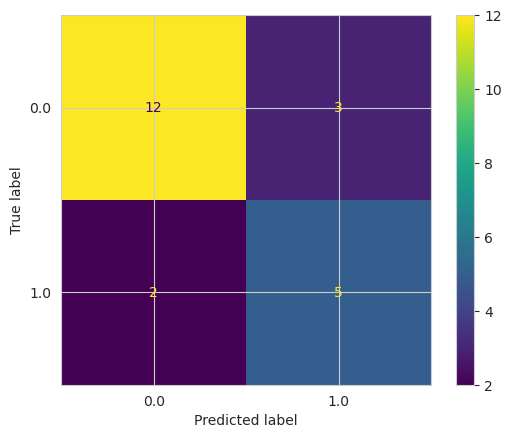

In [ ]:
dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
dt_pred = dt.predict(x_test)
cm = confusion_matrix(y_test,dt_pred)
print(cm)
print('\n')
print(classification_report(y_test,dt_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, dt, new_x, y)


precision :  0.8 
 recall : 0.8571428571428571 
 f1_score : 0.8275862068965518


for fold: 2, accuracy is: 0.8472222222222223
for fold: 3, accuracy is: 0.8333333333333334
for fold: 4, accuracy is: 0.8611111111111112
for fold: 5, accuracy is: 0.8866666666666667
for fold: 6, accuracy is: 0.8472222222222222
for fold: 7, accuracy is: 0.8883116883116885
for fold: 8, accuracy is: 0.875
for fold: 9, accuracy is: 0.875
for fold: 10, accuracy is: 0.8607142857142858
Best fit
7 gives accuracy of 0.8883116883116885


### Random Forest

Accuracy: 1.0
[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        15
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22



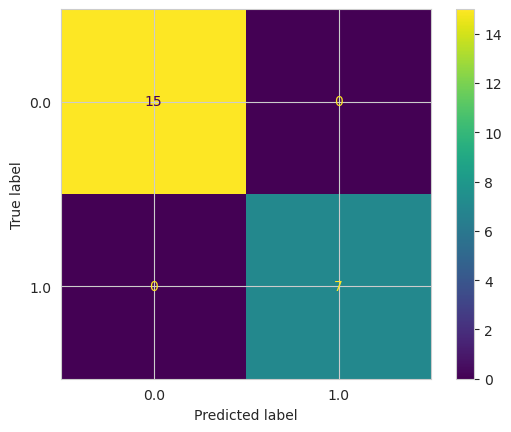

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(x_train, y_train)
y_pred = rf_classifier.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
print(classification_report(y_test,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier, new_x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.8888888888888888
for fold: 3, accuracy is: 0.9444444444444445
for fold: 4, accuracy is: 0.9444444444444444
for fold: 5, accuracy is: 0.9733333333333334
for fold: 6, accuracy is: 0.9722222222222223
for fold: 7, accuracy is: 0.974025974025974
for fold: 8, accuracy is: 0.9583333333333333
for fold: 9, accuracy is: 0.9444444444444444
for fold: 10, accuracy is: 0.975
Best fit
10 gives accuracy of 0.975


## Differential Evolution (DE)

DE is an optimization technique that involves creating new candidate solutions by combining information from existing solutions. In the context of feature selection, DE can be used to generate new feature subsets by combining features from different subsets.

In [ ]:
# please ensure that both X and y have same number of samples i.e 253 if notrerun the "Data Reading & Visualization part"
print(X.shape)
print(y.shape)

(72, 5327)
(72,)


In [ ]:
def init_position(lb, ub, N, dim):
    X = np.zeros([N, dim], dtype='float')
    for i in range(N):
        for d in range(dim):
            X[i,d] = lb[0,d] + (ub[0,d] - lb[0,d]) * rand()

    return X

def binary_conversion(X, thres, N, dim):
    Xbin = np.zeros([N, dim], dtype='int')
    for i in range(N):
        for d in range(dim):
            if X[i,d] > thres:
                Xbin[i,d] = 1
            else:
                Xbin[i,d] = 0

    return Xbin

def boundary(x, lb, ub):
    if x < lb:
        x = lb
    if x > ub:
        x = ub

    return x

In [ ]:
def differentialEvolution(xtrain, ytrain, opts):
    # Parameters
    ub    = 1
    lb    = 0
    thres = 0.5
    CR    = 0.9     # crossover rate
    F     = 0.5     # factor

    N        = opts['N']
    max_iter = opts['T']
    if 'CR' in opts:
        CR   = opts['CR']
    if 'F' in opts:
        F    = opts['F']

    # Dimension
    dim = np.size(xtrain, 1)
    if np.size(lb) == 1:
        ub = ub * np.ones([1, dim], dtype='float')
        lb = lb * np.ones([1, dim], dtype='float')

    # Initialize position
    X     = init_position(lb, ub, N, dim)

    # Binary conversion
    Xbin  = binary_conversion(X, thres, N, dim)

    # Fitness at first iteration
    fit   = np.zeros([N, 1], dtype='float')
    Xgb   = np.zeros([1, dim], dtype='float')
    fitG  = float('inf')

    for i in range(N):
        fit[i,0] = Fun(xtrain, ytrain, Xbin[i,:], opts)
        if fit[i,0] < fitG:
            Xgb[0,:] = X[i,:]
            fitG     = fit[i,0]

    # Pre
    curve = np.zeros([1, max_iter], dtype='float')
    t     = 0

    curve[0,t] = fitG.copy()
    print("Generation:", t + 1)
    print("Best (DE):", curve[0,t])
    t += 1

    while t < max_iter:
        V = np.zeros([N, dim], dtype='float')
        U = np.zeros([N, dim], dtype='float')

        for i in range(N):
            # Choose r1, r2, r3 randomly, but not equal to i
            RN = np.random.permutation(N)
            for j in range(N):
                if RN[j] == i:
                    RN = np.delete(RN, j)
                    break

            r1 = RN[0]
            r2 = RN[1]
            r3 = RN[2]
            # mutation (2)
            for d in range(dim):
                V[i,d] = X[r1,d] + F * (X[r2,d] - X[r3,d])
                # Boundary
                V[i,d] = boundary(V[i,d], lb[0,d], ub[0,d])

            # Random one dimension from 1 to dim
            index = np.random.randint(low = 0, high = dim)
            # crossover (3-4)
            for d in range(dim):
                if (rand() <= CR)  or  (d == index):
                    U[i,d] = V[i,d]
                else:
                    U[i,d] = X[i,d]

        # Binary conversion
        Ubin = binary_conversion(U, thres, N, dim)

        # Selection
        for i in range(N):
            fitU = Fun(xtrain, ytrain, Ubin[i,:], opts)
            if fitU <= fit[i,0]:
                X[i,:]   = U[i,:]
                fit[i,0] = fitU

            if fit[i,0] < fitG:
                Xgb[0,:] = X[i,:]
                fitG     = fit[i,0]


        # Store result
        curve[0,t] = fitG.copy()
        print("Generation:", t + 1)
        print("Best (DE):", curve[0,t])
        t += 1


    # Best feature subset
    Gbin       = binary_conversion(Xgb, thres, 1, dim)
    Gbin       = Gbin.reshape(dim)
    pos        = np.asarray(range(0, dim))
    sel_index  = pos[Gbin == 1]
    num_feat   = len(sel_index)
    # Create dictionary
    de_data = {'sf': sel_index, 'c': curve, 'nf': num_feat}

    return de_data


In [ ]:
# from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(x, y.values, test_size = 0.3, random_state = 101)
print("x_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",X_test.shape)
print("y_test: ",y_test.shape)

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# parameter
k    = 5     # k-value in KNN
N    = 10   # number of chromosomes
T    = 100   # maximum number of iterations
CR   = 0.9  # crossover rate
F = 0.5 # constant factor
fold = {'xt':X_train, 'yt':y_train, 'xv':X_test, 'yv':y_test}
X = x.to_numpy()
Y = y.values
opts = {'k':k, 'fold':fold, 'N':N, 'T':T, 'CR':CR, 'F':F}

x_train shape:  (50, 5327)
y_train shape:  (50,)
x_text:  (22, 5327)
y_test:  (22,)


In [ ]:
print(type(X))
print(type(Y))

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [ ]:
result = differentialEvolution(X, Y, opts)
sel_feat   = result['sf']

Generation: 1
Best (DE): 0.04987516425755581
Generation: 2
Best (DE): 0.04987516425755581
Generation: 3
Best (DE): 0.04987516425755581
Generation: 4
Best (DE): 0.04987516425755581
Generation: 5
Best (DE): 0.04987516425755581
Generation: 6
Best (DE): 0.04987516425755581
Generation: 7
Best (DE): 0.04987516425755581
Generation: 8
Best (DE): 0.004937112821475507
Generation: 9
Best (DE): 0.004937112821475507
Generation: 10
Best (DE): 0.004937112821475507
Generation: 11
Best (DE): 0.004937112821475507
Generation: 12
Best (DE): 0.004937112821475507
Generation: 13
Best (DE): 0.004937112821475507
Generation: 14
Best (DE): 0.004937112821475507
Generation: 15
Best (DE): 0.004895813778862403
Generation: 16
Best (DE): 0.004895813778862403
Generation: 17
Best (DE): 0.004895813778862403
Generation: 18
Best (DE): 0.004895813778862403
Generation: 19
Best (DE): 0.004886427632813971
Generation: 20
Best (DE): 0.004875164257555852
Generation: 21
Best (DE): 0.004875164257555852
Generation: 22
Best (DE): 0.0

In [ ]:
f = result['sf']
# featching features
features = []
for key, val in col_dict.items():
  if key in f:
    features.append(col_dict.get(key))
print("Number of features found: ", len(features))

Number of features found:  2471


In [ ]:
new_x = x[features]
X_train, X_test, y_train, y_test = train_test_split(new_x, y.values, test_size = 0.3, random_state = 101)
print("x_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("x_text: ",X_test.shape)
print("y_test: ",y_test.shape)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

x_train shape:  (50, 2471)
y_train shape:  (50,)
x_text:  (22, 2471)
y_test:  (22,)


### Classification

#### SVC

[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        15
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22



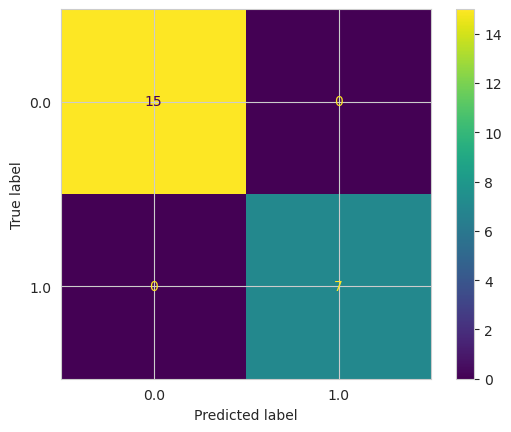

In [ ]:
model_SVC= SVC()
model_SVC.fit(X_train,y_train)
model_pred = model_SVC.predict(X_test)
cm = confusion_matrix(y_test,model_pred)
print(cm)
print('\n')

disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model_SVC.classes_)
disp.plot()
print(classification_report(y_test,model_pred))


In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, model_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, model_SVC, new_x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0
for fold: 2, accuracy is: 0.6805555555555556
for fold: 3, accuracy is: 0.7777777777777777
for fold: 4, accuracy is: 0.763888888888889
for fold: 5, accuracy is: 0.781904761904762
for fold: 6, accuracy is: 0.8055555555555555
for fold: 7, accuracy is: 0.822077922077922
for fold: 8, accuracy is: 0.8333333333333334
for fold: 9, accuracy is: 0.8194444444444444
for fold: 10, accuracy is: 0.8071428571428572
Best fit
8 gives accuracy of 0.8333333333333334


#### Naive Bayes

[[14  1]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      0.93      0.97        15
         1.0       0.88      1.00      0.93         7

    accuracy                           0.95        22
   macro avg       0.94      0.97      0.95        22
weighted avg       0.96      0.95      0.96        22



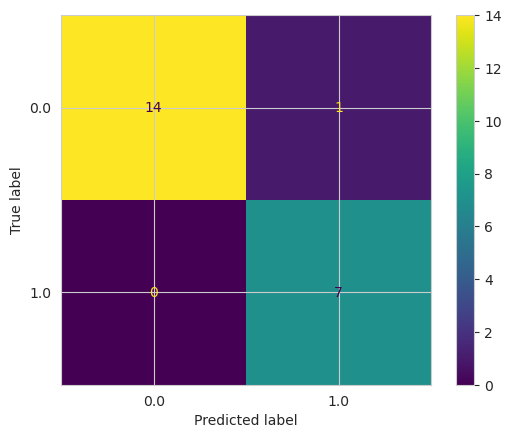

In [ ]:
gnb = GaussianNB()
gnb.fit(X_train, y_train)

y_pred = gnb.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=gnb.classes_)
disp.plot()
print(classification_report(y_test,y_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

# K-Fold
acc = k_evaluate(10, gnb, new_x, y)

precision :  0.9333333333333333 
 recall : 1.0 
 f1_score : 0.9655172413793104
for fold: 2, accuracy is: 0.9861111111111112
for fold: 3, accuracy is: 0.9861111111111112
for fold: 4, accuracy is: 0.9722222222222222
for fold: 5, accuracy is: 0.9857142857142858
for fold: 6, accuracy is: 0.986111111111111
for fold: 7, accuracy is: 0.9857142857142858
for fold: 8, accuracy is: 0.9861111111111112
for fold: 9, accuracy is: 0.9861111111111112
for fold: 10, accuracy is: 0.9857142857142858
Best fit
2 gives accuracy of 0.9861111111111112


#### Decision Tree

[[10  5]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      0.67      0.80        15
         1.0       0.58      1.00      0.74         7

    accuracy                           0.77        22
   macro avg       0.79      0.83      0.77        22
weighted avg       0.87      0.77      0.78        22



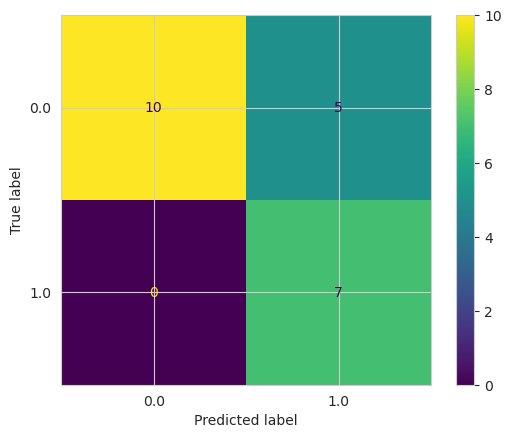

In [ ]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
dt_pred = dt.predict(X_test)
cm = confusion_matrix(y_test,dt_pred)
print(cm)
print('\n')
print(classification_report(y_test,dt_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=dt.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, dt_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, dt, new_x, y)

precision :  0.6666666666666666 
 recall : 1.0 
 f1_score : 0.8


for fold: 2, accuracy is: 0.8333333333333333
for fold: 3, accuracy is: 0.8194444444444445
for fold: 4, accuracy is: 0.8611111111111112
for fold: 5, accuracy is: 0.9019047619047619
for fold: 6, accuracy is: 0.8611111111111112
for fold: 7, accuracy is: 0.8337662337662337
for fold: 8, accuracy is: 0.8055555555555556
for fold: 9, accuracy is: 0.8611111111111112
for fold: 10, accuracy is: 0.8767857142857143
Best fit
5 gives accuracy of 0.9019047619047619


#### Random Forest

Accuracy: 1.0
[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        15
         1.0       1.00      1.00      1.00         7

    accuracy                           1.00        22
   macro avg       1.00      1.00      1.00        22
weighted avg       1.00      1.00      1.00        22



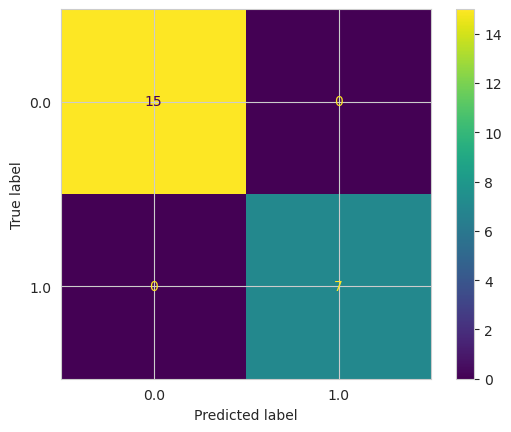

In [ ]:
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

cm = confusion_matrix(y_test,y_pred)
print(cm)
print('\n')
print(classification_report(y_test,y_pred))
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=rf_classifier.classes_)
disp.plot()

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, y_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)
print("\n")
# K-Fold
acc = k_evaluate(10, rf_classifier, new_x, y)

precision :  1.0 
 recall : 1.0 
 f1_score : 1.0


for fold: 2, accuracy is: 0.9027777777777778
for fold: 3, accuracy is: 0.9722222222222222
for fold: 4, accuracy is: 0.9444444444444444
for fold: 5, accuracy is: 0.9733333333333334
for fold: 6, accuracy is: 0.9583333333333334
for fold: 7, accuracy is: 0.974025974025974
for fold: 8, accuracy is: 0.9583333333333333
for fold: 9, accuracy is: 0.9583333333333334
for fold: 10, accuracy is: 0.9607142857142857
Best fit
7 gives accuracy of 0.974025974025974


#### LDA

[[15  0]
 [ 0  7]]


              precision    recall  f1-score   support

         0.0       0.94      1.00      0.97        15
         1.0       1.00      0.86      0.92         7

    accuracy                           0.95        22
   macro avg       0.97      0.93      0.95        22
weighted avg       0.96      0.95      0.95        22



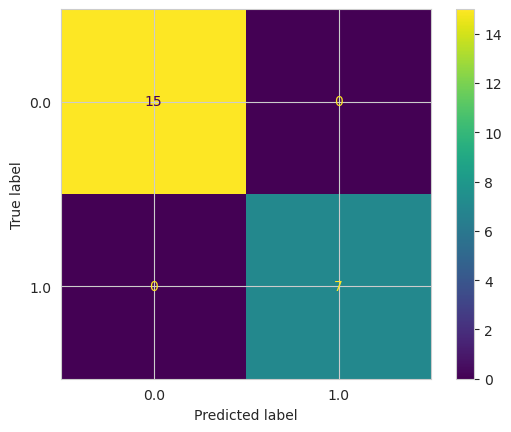

In [ ]:
lda = LinearDiscriminantAnalysis()
lda.fit(X_train,y_train)
lda_pred = lda.predict(X_test)
confusion_matrix(y_test,lda_pred)
print(cm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=lda.classes_)
disp.plot()
print('\n')
print(classification_report(y_test,lda_pred))

In [ ]:
# Calculate all
precision,recall,f1_score = evaluate_fn(y_test, lda_pred)  # takes y_test and model pred
print("precision : ",precision,'\n',"recall :",recall,'\n',"f1_score :",f1_score)

#Kfold
acc = k_evaluate(10,lda, new_x, y)  # here k 10

precision :  1.0 
 recall : 0.9375 
 f1_score : 0.967741935483871
for fold: 2, accuracy is: 0.9027777777777778
for fold: 3, accuracy is: 0.9166666666666666
for fold: 4, accuracy is: 0.8888888888888888
for fold: 5, accuracy is: 0.9057142857142857
for fold: 6, accuracy is: 0.9166666666666666
for fold: 7, accuracy is: 0.9454545454545455
for fold: 8, accuracy is: 0.9444444444444444
for fold: 9, accuracy is: 0.9305555555555556
for fold: 10, accuracy is: 0.9446428571428571
Best fit
7 gives accuracy of 0.9454545454545455


# Great Job!!